IMPORTING LIBRARIES

In [13]:
# Import essential libraries for data manipulation, machine learning, and evaluation
import pandas as pd         # For data handling and manipulation
import numpy as np          # For numerical operations
import matplotlib.pyplot as plt  # For plotting and visualizations
import seaborn as sns       # For better visualization with seaborn
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score,classification_report, roc_auc_score,roc_curve
import warnings
warnings.filterwarnings("ignore")# to prevent warning msgs

# Import machine learning libraries
from sklearn.model_selection import train_test_split  # For splitting the dataset into train and test sets
from sklearn.preprocessing import StandardScaler      # For scaling features
from sklearn.ensemble import RandomForestRegressor     # For regression model (Random Forest)
from sklearn.metrics import mean_squared_error, r2_score  # For model evaluation (RMSE, R²)
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier


DATA COLLECTION

In [14]:
import pandas as pd

path = "/content/drive/MyDrive/Dataset DSML/Trade_in_Low_Carbon_Tech.csv"
data = pd.read_csv(path, encoding='latin1')  # or 'ISO-8859-1' or 'cp1252'


In [ ]:
data = pd.read_csv(path, encoding='latin1')  # Try an alternative encoding
data

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2023,unseen_pred
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Comparative advantage in low carbon technology...,Index,Department of Economic and Social Affairs/Unit...,ECBTLA,Trade in Low Carbon Technology Products; Compa...,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,8.920000e-05,8.180000e-05,5.877250e-04,NaN,NaN,NaN,NaN,2
1,2,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,3.401980e+03,3.217850e+03,2.408955e+04,NaN,NaN,NaN,NaN,2
2,3,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as p...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,1.800000e-05,1.750000e-05,1.276220e-04,NaN,NaN,NaN,NaN,2
3,4,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,4.077410e-04,3.676780e-04,2.788680e-03,NaN,NaN,NaN,NaN,2
4,5,"Afghanistan, Islamic Rep. of",AF,AFG,Imports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",...,8.503327e+06,6.561112e+06,1.611734e+07,1.912370e+07,1.054682e+08,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,2145,Zimbabwe,ZW,ZWE,Imports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",...,3.175835e+00,3.689556e+00,3.396853e+00,3.572504e+00,4.526781e+00,5.830961e+00,5.305372e+00,5.575392e+00,4.930165e+00,203
2139,2146,Zimbabwe,ZW,ZWE,Total trade in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",...,1.400469e+08,1.436859e+08,1.403382e+08,1.582177e+08,1.808416e+08,2.519870e+08,3.193733e+08,3.713313e+08,3.666519e+08,203
2140,2147,Zimbabwe,ZW,ZWE,Total trade in low carbon technology products ...,Percent,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",...,7.013101e-01,6.990162e-01,6.365724e-01,4.268619e-01,6.946711e-01,9.375067e-01,8.867523e-01,1.186714e+00,1.138104e+00,203
2141,2148,Zimbabwe,ZW,ZWE,Trade balance in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLB,Trade in Low Carbon Technology Products; Trade...,"Environment, Climate Change, Mitigation, Trade...",...,-1.294617e+08,-1.354482e+08,-1.287631e+08,-1.470443e+08,-1.395372e+08,-2.399166e+08,-3.025721e+08,-3.534533e+08,-3.488867e+08,203


In [ ]:
path_df=pd.DataFrame(data)

In [ ]:
path_df

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2023,unseen_pred
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Comparative advantage in low carbon technology...,Index,Department of Economic and Social Affairs/Unit...,ECBTLA,Trade in Low Carbon Technology Products; Compa...,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,8.920000e-05,8.180000e-05,5.877250e-04,NaN,NaN,NaN,NaN,2
1,2,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,3.401980e+03,3.217850e+03,2.408955e+04,NaN,NaN,NaN,NaN,2
2,3,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as p...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,1.800000e-05,1.750000e-05,1.276220e-04,NaN,NaN,NaN,NaN,2
3,4,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,4.077410e-04,3.676780e-04,2.788680e-03,NaN,NaN,NaN,NaN,2
4,5,"Afghanistan, Islamic Rep. of",AF,AFG,Imports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",...,8.503327e+06,6.561112e+06,1.611734e+07,1.912370e+07,1.054682e+08,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,2145,Zimbabwe,ZW,ZWE,Imports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",...,3.175835e+00,3.689556e+00,3.396853e+00,3.572504e+00,4.526781e+00,5.830961e+00,5.305372e+00,5.575392e+00,4.930165e+00,203
2139,2146,Zimbabwe,ZW,ZWE,Total trade in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",...,1.400469e+08,1.436859e+08,1.403382e+08,1.582177e+08,1.808416e+08,2.519870e+08,3.193733e+08,3.713313e+08,3.666519e+08,203
2140,2147,Zimbabwe,ZW,ZWE,Total trade in low carbon technology products ...,Percent,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",...,7.013101e-01,6.990162e-01,6.365724e-01,4.268619e-01,6.946711e-01,9.375067e-01,8.867523e-01,1.186714e+00,1.138104e+00,203
2141,2148,Zimbabwe,ZW,ZWE,Trade balance in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLB,Trade in Low Carbon Technology Products; Trade...,"Environment, Climate Change, Mitigation, Trade...",...,-1.294617e+08,-1.354482e+08,-1.287631e+08,-1.470443e+08,-1.395372e+08,-2.399166e+08,-3.025721e+08,-3.534533e+08,-3.488867e+08,203


BASIC STATISTICS:

In [ ]:
print("\nDATASET SIZE:")
path_df.shape


DATASET SIZE:


(2143, 43)

In [ ]:
print("\n Basic Statistics:")
path_df.info()


 Basic Statistics:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2143 entries, 0 to 2142
Data columns (total 43 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ObjectId             2143 non-null   int64  
 1   Country              2143 non-null   object 
 2   ISO2                 2110 non-null   object 
 3   ISO3                 2121 non-null   object 
 4   Indicator            2143 non-null   object 
 5   Unit                 2143 non-null   object 
 6   Source               2143 non-null   object 
 7   CTS_Code             2143 non-null   object 
 8   CTS_Name             2143 non-null   object 
 9   CTS_Full_Descriptor  2143 non-null   object 
 10  Trade_Flow           2143 non-null   object 
 11  Scale                2143 non-null   object 
 12  F1994                720 non-null    float64
 13  F1995                830 non-null    float64
 14  F1996                908 non-null    float64
 15  F1997             

In [ ]:
path_df.describe()

,ObjectId,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,...,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2023,unseen_pred
count,2143.000000,7.200000e+02,8.300000e+02,9.080000e+02,9.480000e+02,1.371000e+03,1.464000e+03,1.661000e+03,1.677000e+03,1.697000e+03,...,1.837000e+03,1.859000e+03,1.889000e+03,1.851000e+03,1.801000e+03,1.766000e+03,1.785000e+03,1.608000e+03,1.311000e+03,2143.000000
mean,1072.543164,1.385211e+09,1.531140e+09,1.524990e+09,1.541488e+09,1.096274e+09,1.093049e+09,1.126585e+09,1.086062e+09,1.098939e+09,...,3.092798e+09,2.995846e+09,3.395319e+09,3.727297e+09,3.939804e+09,4.114676e+09,5.072809e+09,5.381870e+09,6.818265e+09,99.802613
std,619.632756,1.167803e+10,1.380172e+10,1.447517e+10,1.510599e+10,1.287938e+10,1.326431e+10,1.461151e+10,1.415463e+10,1.436792e+10,...,4.157898e+10,4.073000e+10,4.620267e+10,5.003096e+10,5.228887e+10,5.404698e+10,6.709586e+10,6.748542e+10,7.730962e+10,59.670381
min,1.000000,-7.093866e+09,-7.571388e+09,-8.445937e+09,-6.727012e+09,-6.543204e+09,-7.157958e+09,-9.108712e+09,-9.603665e+09,-1.529988e+10,...,-8.541290e+09,-1.903120e+10,-2.275297e+10,-2.393490e+10,-2.848850e+10,-3.671848e+10,-5.453843e+10,-5.807098e+10,-7.768551e+10,0.000000
25%,536.500000,3.382062e-02,4.245792e-02,3.517786e-02,2.405548e-02,1.128266e-01,1.197011e-01,8.414909e-02,8.468798e-02,9.112847e-02,...,1.139002e-01,1.171409e-01,1.119763e-01,1.039563e-01,1.171031e-01,1.099328e-01,1.089515e-01,1.205383e-01,1.867605e-01,48.000000
50%,1072.000000,1.091291e+00,1.084656e+00,1.073496e+00,1.078962e+00,1.204817e+00,1.216314e+00,1.095845e+00,1.094204e+00,1.052610e+00,...,1.364656e+00,1.346353e+00,1.373811e+00,1.495282e+00,1.516533e+00,1.576907e+00,1.587689e+00,1.645961e+00,2.032883e+00,100.000000
75%,1607.500000,5.075036e+07,4.535950e+07,4.330073e+07,3.812333e+07,6.227328e+06,3.861569e+06,2.095964e+06,2.075434e+06,2.308665e+06,...,1.182573e+07,9.104005e+06,8.288747e+06,9.229277e+06,1.433221e+07,1.120859e+07,1.331167e+07,1.934837e+07,3.198203e+07,151.000000
max,2149.000000,2.475580e+11,3.145650e+11,3.457230e+11,3.684300e+11,3.781360e+11,4.019060e+11,4.702360e+11,4.586140e+11,4.691800e+11,...,1.410030e+12,1.392350e+12,1.592940e+12,1.707040e+12,1.759580e+12,1.799680e+12,2.244640e+12,2.144680e+12,2.209890e+12,203.000000


DATA CLEANING

In [ ]:
path_df.isnull().sum() #Finding missing values

,0
ObjectId,0
Country,0
ISO2,33
ISO3,22
Indicator,0
Unit,0
Source,0
CTS_Code,0
CTS_Name,0
CTS_Full_Descriptor,0


In [ ]:
path_df.replace('?', np.nan, inplace=True) #handling unwanted symbols in missing area and its replaced into nan

In [ ]:
path_df.isnull().sum() #after replacement find missing values again

,0
ObjectId,0
Country,0
ISO2,33
ISO3,22
Indicator,0
Unit,0
Source,0
CTS_Code,0
CTS_Name,0
CTS_Full_Descriptor,0


In [ ]:
#missing values are located in categorical columns
# Identify categorical columns in the dataset
categorical_columns = path_df.select_dtypes(include='object').columns

# Fill missing values in each categorical column with the mode (most frequent value)
for col in categorical_columns:
    if path_df[col].isnull().sum() > 0:  # Only process columns with missing values
        path_df[col].fillna(path_df[col].mode()[0], inplace=True)

# Optional: Print confirmation of completed operation
print("Missing values in categorical columns handled successfully.")

Missing values in categorical columns handled successfully.


In [15]:
path_df = path_df.fillna({col: path_df[col].mode()[0]})


In [16]:
path_df.isnull().sum()  # handling missing values recheck the datset

,0
ObjectId,0
Country,0
ISO2,0
ISO3,0
Indicator,0
Unit,0
Source,0
CTS_Code,0
CTS_Name,0
CTS_Full_Descriptor,0


In [17]:
path_df.duplicated().sum() #finf duplicates

0

In [18]:
path_df=path_df.drop_duplicates() #handling duplicates

In [19]:
print(f"Shape after removing duplicates: {path_df.shape}")

Shape after removing duplicates: (2143, 43)


In [20]:
path_df.duplicated().sum()

0

In [23]:
numeric_columns = path_df.select_dtypes(include=['number']) #finf numeric columns

In [24]:
print("\nNumerical Columns:",numeric_columns)


Numerical Columns:       ObjectId  F1994         F1995  F1996  F1997  F1998  F1999         F2000  \
0            1    NaN           NaN    NaN    NaN    NaN    NaN           NaN   
1            2    NaN           NaN    NaN    NaN    NaN    NaN           NaN   
2            3    NaN           NaN    NaN    NaN    NaN    NaN           NaN   
3            4    NaN           NaN    NaN    NaN    NaN    NaN           NaN   
4            5    NaN           NaN    NaN    NaN    NaN    NaN           NaN   
...        ...    ...           ...    ...    ...    ...    ...           ...   
2138      2145    NaN           NaN    NaN    NaN    NaN    NaN  2.412206e+00   
2139      2146    NaN  1.131560e+08    NaN    NaN    NaN    NaN  4.279276e+07   
2140      2147    NaN  1.369459e+00    NaN    NaN    NaN    NaN  3.773679e-01   
2141      2148    NaN -1.068472e+08    NaN    NaN    NaN    NaN -3.507404e+07   
2142      2149    NaN -1.293108e+00    NaN    NaN    NaN    NaN -3.093004e-01   

       

Outliers Detection

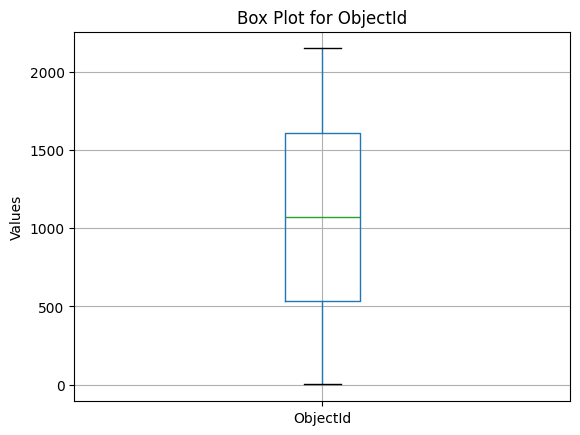

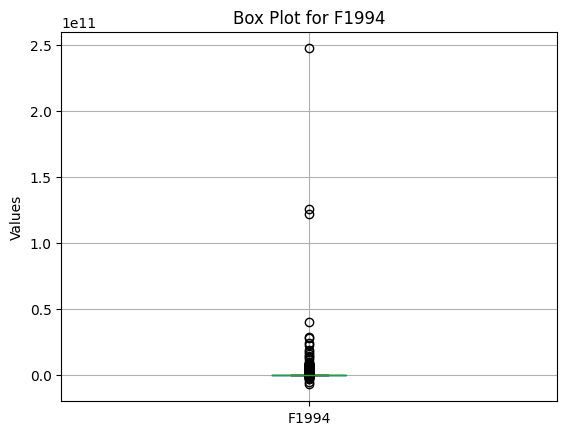

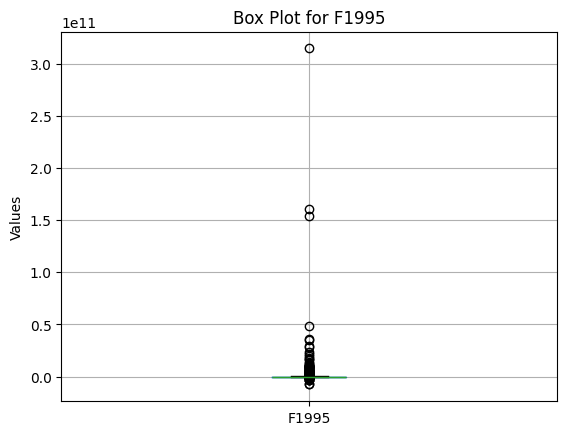

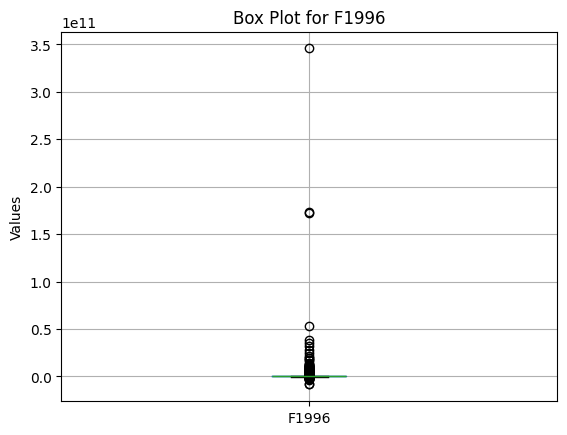

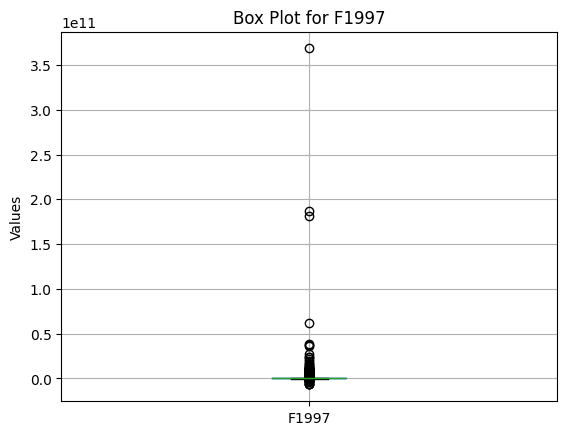

...

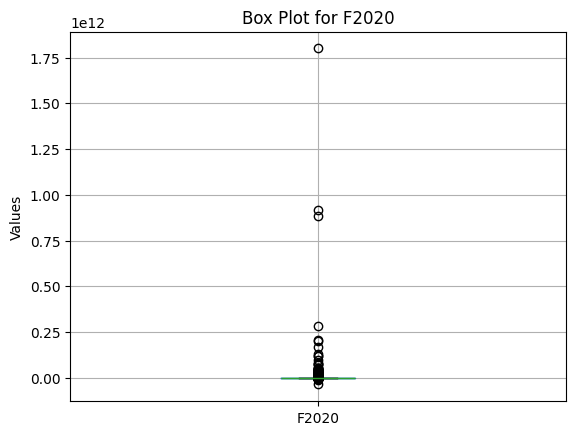

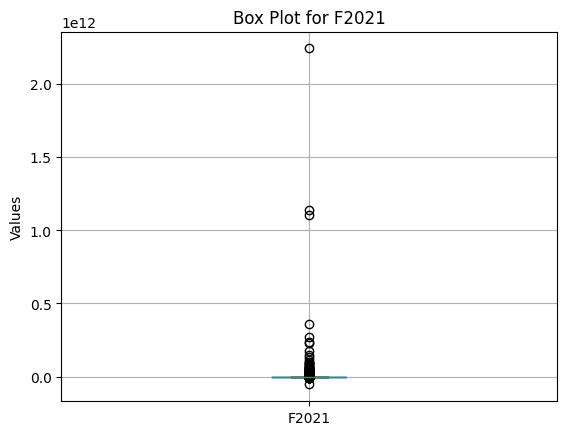

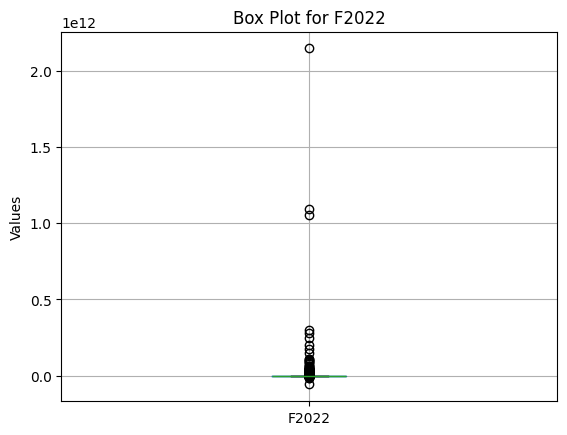

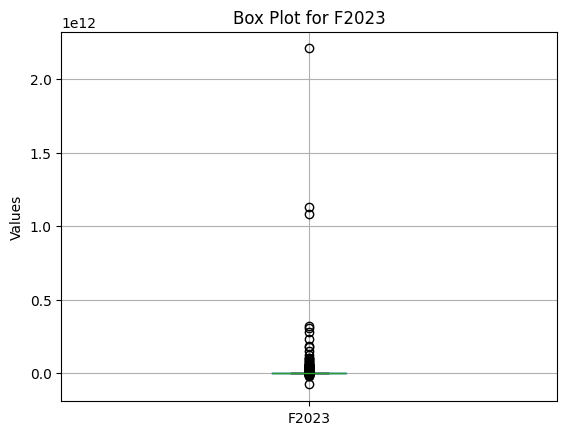

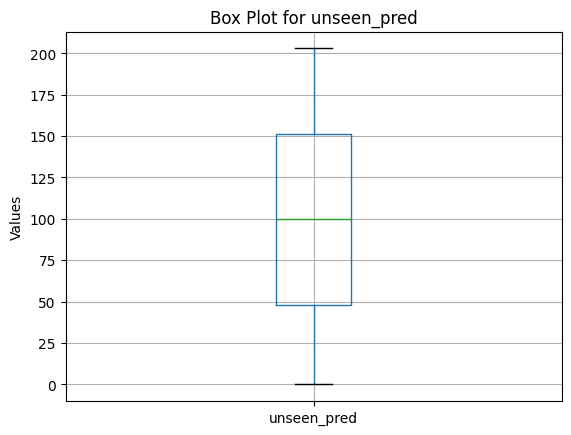

In [25]:
# forloop
# Create box plots for numerical columns using a for loop
for column in numeric_columns.columns:
    plt.figure()  # Create a new figure for each plot
    numeric_columns.boxplot(column=column)
    plt.title(f"Box Plot for {column}")
    plt.ylabel("Values")
    plt.show()

OUTLINERS REMOVAL

In [26]:
def handle_outliers_iqr(df):
    # Iterate over all numeric columns
    for col in df.select_dtypes(include=['int64', 'float64']).columns:
        # Calculate the IQR, lower and upper bounds
        Q1 = df[col].quantile(0.25)  # 25th percentile
        Q3 = df[col].quantile(0.75)  # 75th percentile
        IQR = Q3 - Q1

        lower = Q1 - 1.5 * IQR  # Lower limit
        upper = Q3 + 1.5 * IQR  # Upper limit

        # Apply capping (Winsorizing) to cap values beyond bounds
        df[col] = df[col].apply(lambda x: lower if x < lower else upper if x > upper else x)
    return df
# Apply the function to handle outliers in the dataset
path_df1 = handle_outliers_iqr(path_df)

# Verify the result
print(f"Shape of the DataFrame after handling outliers: {path_df1.shape}")

Shape of the DataFrame after handling outliers: (2143, 43)


In [ ]:
path_df1.head

<bound method NDFrame.head of       ObjectId                       Country ISO2 ISO3  \
0            1  Afghanistan, Islamic Rep. of   AF  AFG   
1            2  Afghanistan, Islamic Rep. of   AF  AFG   
2            3  Afghanistan, Islamic Rep. of   AF  AFG   
3            4  Afghanistan, Islamic Rep. of   AF  AFG   
4            5  Afghanistan, Islamic Rep. of   AF  AFG   
...        ...                           ...  ...  ...   
2138      2145                      Zimbabwe   ZW  ZWE   
2139      2146                      Zimbabwe   ZW  ZWE   
2140      2147                      Zimbabwe   ZW  ZWE   
2141      2148                      Zimbabwe   ZW  ZWE   
2142      2149                      Zimbabwe   ZW  ZWE   

                                              Indicator        Unit  \
0     Comparative advantage in low carbon technology...       Index   
1             Exports of low carbon technology products  US Dollars   
2     Exports of low carbon technology products as p...     Percent   
3     Exports of low carbon technology products as s...     Percent   
4             Imports of low carbon technology products  US Dollars   
...                                                 ...         ...   
2138  Imports of low carbon technology products as s...     Percent   
2139      Total trade in low carbon technology products  US Dollars   
2140  Total trade in low carbon technology products ...     Percent   
2141    Trade balance in low carbon technology products  US Dollars   
2142  Trade balance in low carbon technology product...     Percent   

                                                 Source CTS_Code  \
0     Department of Economic and Social Affairs/Unit...   ECBTLA   
1     Department of Economic and Social Affairs/Unit...   ECBTLX   
2     Department of Economic and Social Affairs/Unit...   ECBTLX   
3     Department of Economic and Social Affairs/Unit...   ECBTLX   
4     Department of Economic and Social Affairs/Unit...   ECBTLM   
...                                                 ...      ...   
2138  Department of Economic and Social Affairs/Unit...   ECBTLM   
2139  Department of Economic and Social Affairs/Unit...    ECBTL   
2140  Department of Economic and Social Affairs/Unit...    ECBTL   
2141  Department of Economic and Social Affairs/Unit...   ECBTLB   
2142  Department of Economic and Social Affairs/Unit...   ECBTLB   

                                               CTS_Name  \
0     Trade in Low Carbon Technology Products; Compa...   
1      Trade in Low Carbon Technology Products; Exports   
2      Trade in Low Carbon Technology Products; Exports   
3      Trade in Low Carbon Technology Products; Exports   
4      Trade in Low Carbon Technology Products; Imports   
...                                                 ...   
2138   Trade in Low Carbon Technology Products; Imports   
2139            Trade in Low Carbon Technology Products   
2140            Trade in Low Carbon Technology Products   
2141  Trade in Low Carbon Technology Products; Trade...   
2142  Trade in Low Carbon Technology Products; Trade...   

                                    CTS_Full_Descriptor  ...         F2014  \
0     Environment, Climate Change, Mitigation, Trade...  ...           NaN   
1     Environment, Climate Change, Mitigation, Trade...  ...           NaN   
2     Environment, Climate Change, Mitigation, Trade...  ...           NaN   
3     Environment, Climate Change, Mitigation, Trade...  ...           NaN   
4     Environment, Climate Change, Mitigation, Trade...  ...           NaN   
...                                                 ...  ...           ...   
2138  Environment, Climate Change, Mitigation, Trade...  ...  2.545643e+00   
2139  Environment, Climate Change, Mitigation, Trade...  ...  2.879804e+07   
2140  Environment, Climate Change, Mitigation, Trade...  ...  6.313605e-01   
2141  Environment, Climate Change, Mitigation, Trade...  ... -1.727883e+07   
2142  Environment, Climate Change, M

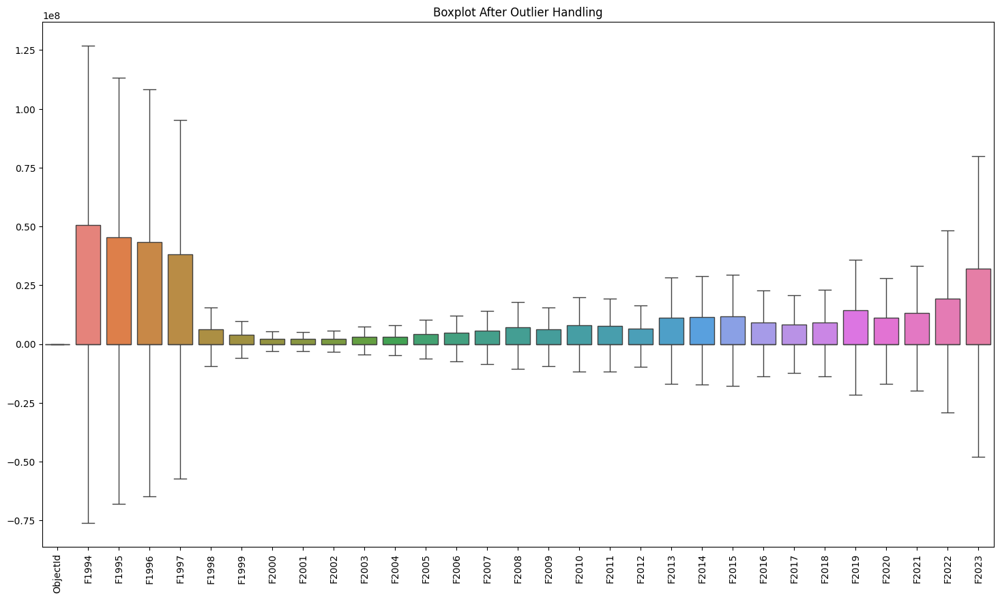

In [ ]:
plt.figure(figsize=(18,10))
sns.boxplot(data=path_df1)
plt.title("Boxplot After Outlier Handling")
plt.xticks(rotation=90)

plt.show()

In [ ]:
# Check skewness of numerical columns
numerical_features = path_df1.select_dtypes(include=['float64', 'int64']).columns
#numerical_features
print(path_df1[numerical_features].skew())

ObjectId    0.003943
F1994       0.707767
F1995       0.725861
F1996       0.716297
F1997       0.677349
F1998       0.683722
F1999       0.691619
F2000       0.681273
F2001       0.670205
F2002       0.683249
F2003       0.703645
F2004       0.691258
F2005       0.702803
F2006       0.696986
F2007       0.701494
F2008       0.705649
F2009       0.708672
F2010       0.706496
F2011       0.707562
F2012       0.707619
F2013       0.727432
F2014       0.727612
F2015       0.733443
F2016       0.715741
F2017       0.700397
F2018       0.700601
F2019       0.715569
F2020       0.692769
F2021       0.688229
F2022       0.695796
F2023       0.707335
dtype: float64


HANDLING SKEWNESS

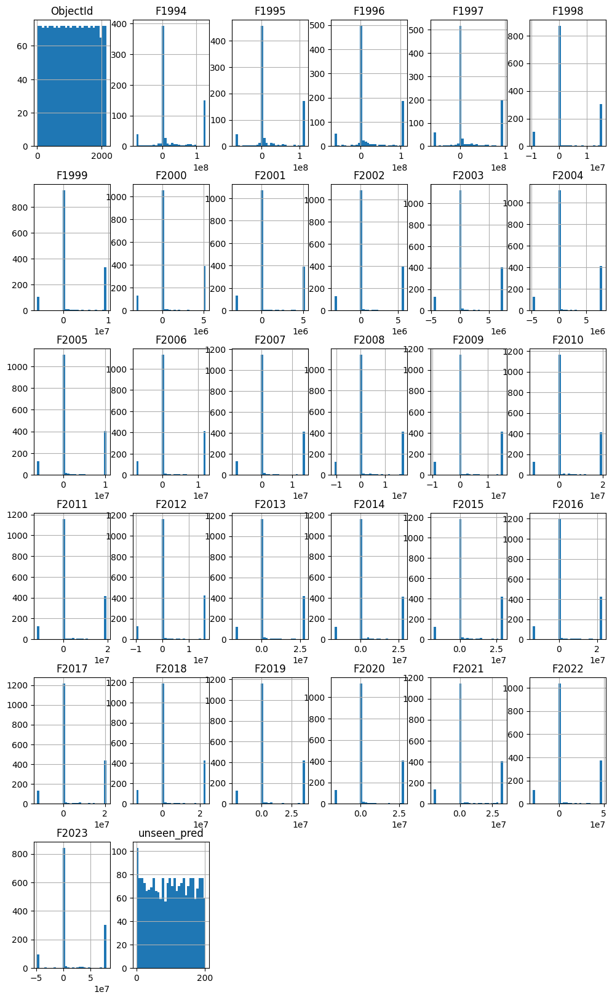

In [27]:
# Plot histograms before transformed features
path_df1.hist(figsize=(12, 20), bins=30)
plt.show()

In [28]:
path_df1=path_df1.drop(['ObjectId'],axis=1)

In [29]:
path_df1

,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,Trade_Flow,...,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2023,unseen_pred
0,"Afghanistan, Islamic Rep. of",AF,AFG,Comparative advantage in low carbon technology...,Index,Department of Economic and Social Affairs/Unit...,ECBTLA,Trade in Low Carbon Technology Products; Compa...,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,...,NaN,NaN,8.920000e-05,8.180000e-05,5.877250e-04,NaN,NaN,NaN,NaN,2
1,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",Exports,...,NaN,NaN,3.401980e+03,3.217850e+03,2.408955e+04,NaN,NaN,NaN,NaN,2
2,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as p...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",Exports,...,NaN,NaN,1.800000e-05,1.750000e-05,1.276220e-04,NaN,NaN,NaN,NaN,2
3,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",Exports,...,NaN,NaN,4.077410e-04,3.676780e-04,2.788680e-03,NaN,NaN,NaN,NaN,2
4,"Afghanistan, Islamic Rep. of",AF,AFG,Imports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",Imports,...,8.503327e+06,6.561112e+06,1.611734e+07,1.912370e+07,3.583052e+07,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,Zimbabwe,ZW,ZWE,Imports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",Imports,...,3.175835e+00,3.689556e+00,3.396853e+00,3.572504e+00,4.526781e+00,5.830961e+00,5.305372e+00,5.575392e+00,4.930165e+00,203
2139,Zimbabwe,ZW,ZWE,Total trade in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,...,2.956432e+07,2.276001e+07,2.072187e+07,2.307319e+07,3.583052e+07,2.802147e+07,3.327918e+07,4.837094e+07,7.995508e+07,203
2140,Zimbabwe,ZW,ZWE,Total trade in low carbon technology products ...,Percent,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,...,7.013101e-01,6.990162e-01,6.365724e-01,4.268619e-01,6.946711e-01,9.375067e-01,8.867523e-01,1.186714e+00,1.138104e+00,203
2141,Zimbabwe,ZW,ZWE,Trade balance in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLB,Trade in Low Carbon Technology Products; Trade...,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,...,-1.773859e+07,-1.365601e+07,-1.243312e+07,-1.384391e+07,-2.149831e+07,-1.681288e+07,-1.996751e+07,-2.902256e+07,-4.797305e+07,203


In [32]:
# Import essential libraries for data manipulation, machine learning, and evaluation
import pandas as pd         # For data handling and manipulation
import numpy as np          # For numerical operations
import matplotlib.pyplot as plt  # For plotting and visualizations
import seaborn as sns       # For better visualization with seaborn
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score,classification_report, roc_auc_score,roc_curve
import warnings
warnings.filterwarnings("ignore")# to prevent warning msgs

# Import machine learning libraries
from sklearn.model_selection import train_test_split  # For splitting the dataset into train and test sets
from sklearn.preprocessing import StandardScaler, PowerTransformer      # For scaling features, import PowerTransformer here
from sklearn.ensemble import RandomForestRegressor     # For regression model (Random Forest)
from sklearn.metrics import mean_squared_error, r2_score  # For model evaluation (RMSE, R²)
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# ... (rest of your code)


# Check skewness of numerical columns
numerical_features = path_df1.select_dtypes(include=['float64', 'int64']).columns

# Remove 'ObjectId' from numerical_features if it exists
if 'ObjectId' in numerical_features:
    numerical_features = numerical_features.drop('ObjectId')

print(path_df1[numerical_features].skew())


# Instantiate the transformer with the desired method
pt = PowerTransformer(method='yeo-johnson')

# Apply the transformation to the updated numerical features
path_df1[numerical_features] = pt.fit_transform(path_df1[numerical_features])

# Check the skewness of transformed numerical features
print(path_df1[numerical_features].skew())

F1994          0.707767
F1995          0.725861
F1996          0.716297
F1997          0.677349
F1998          0.683722
F1999          0.691619
F2000          0.681273
F2001          0.670205
F2002          0.683249
F2003          0.703645
F2004          0.691258
F2005          0.702803
F2006          0.696986
F2007          0.701494
F2008          0.705649
F2009          0.708672
F2010          0.706496
F2011          0.707562
F2012          0.707619
F2013          0.727432
F2014          0.727612
F2015          0.733443
F2016          0.715741
F2017          0.700397
F2018          0.700601
F2019          0.715569
F2020          0.692769
F2021          0.688229
F2022          0.695796
F2023          0.707335
unseen_pred   -0.008790
dtype: float64
F1994         -0.161501
F1995         -0.166081
F1996         -0.164023
F1997         -0.138632
F1998         -0.261970
F1999         -0.279533
F2000         -0.279244
F2001         -0.274095
F2002         -0.290474
F2003         -0.295058
F

<Axes: ylabel='Density'>

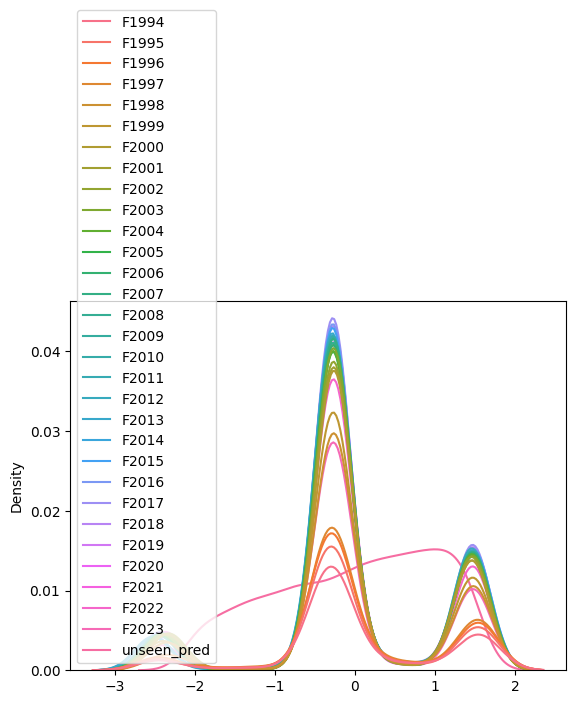

In [33]:
sns.kdeplot(path_df1)

Exploratory Data Analysis (EDA)

<Figure size 640x480 with 0 Axes>

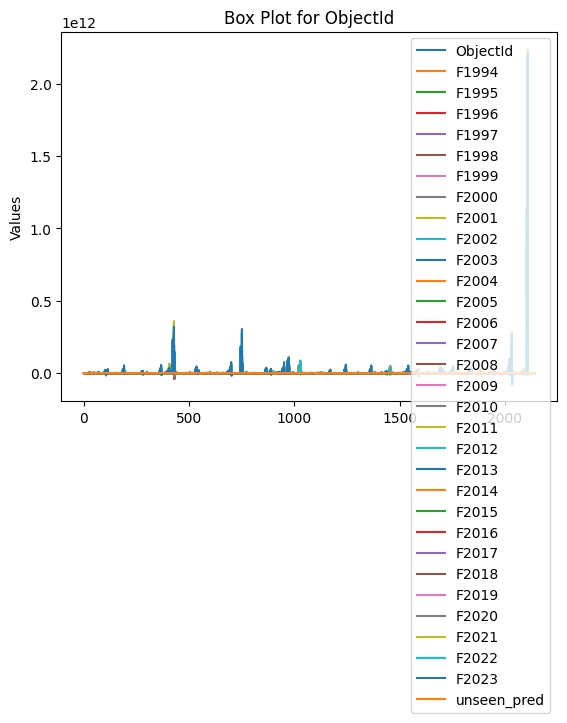

<Figure size 640x480 with 0 Axes>

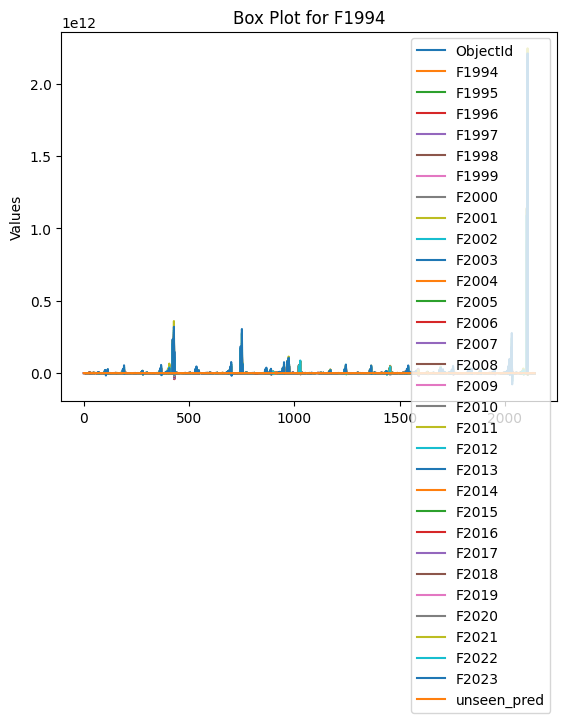

<Figure size 640x480 with 0 Axes>

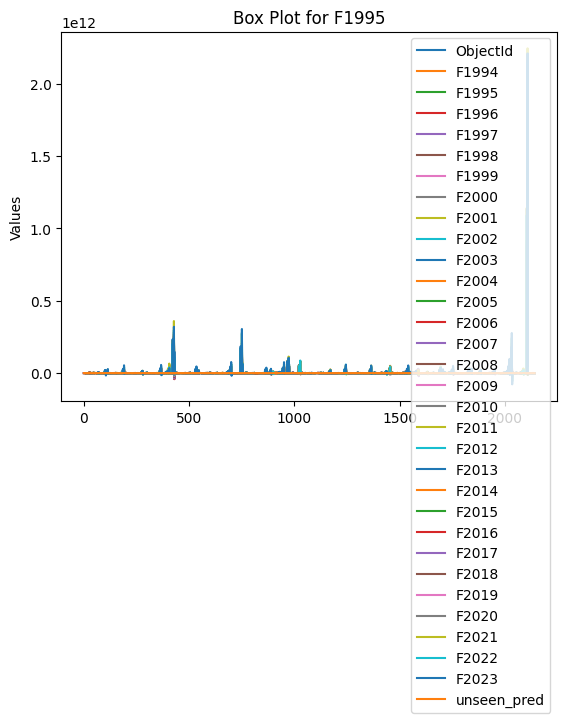

<Figure size 640x480 with 0 Axes>

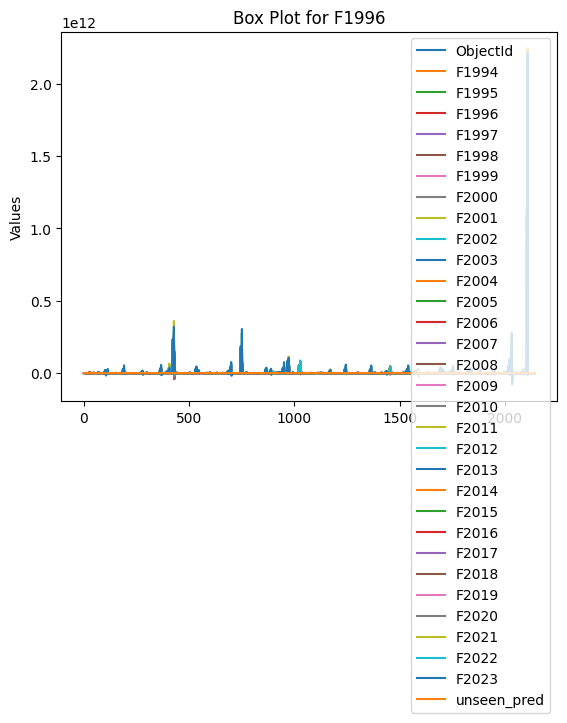

<Figure size 640x480 with 0 Axes>

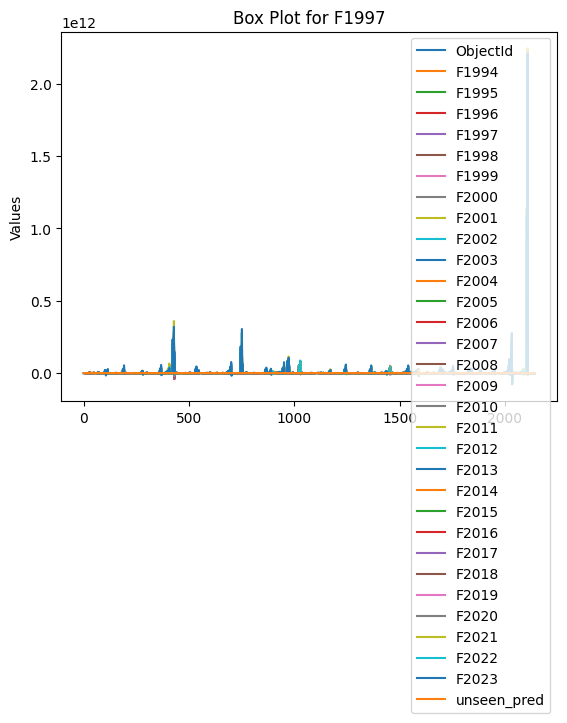

<Figure size 640x480 with 0 Axes>

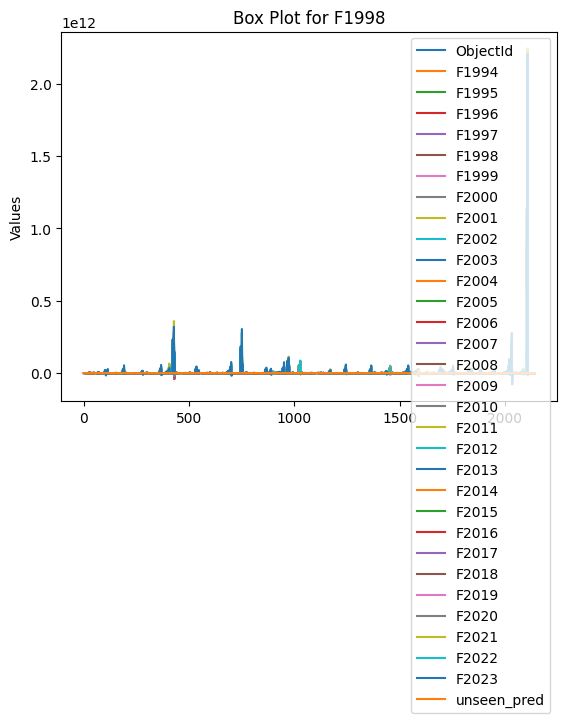

<Figure size 640x480 with 0 Axes>

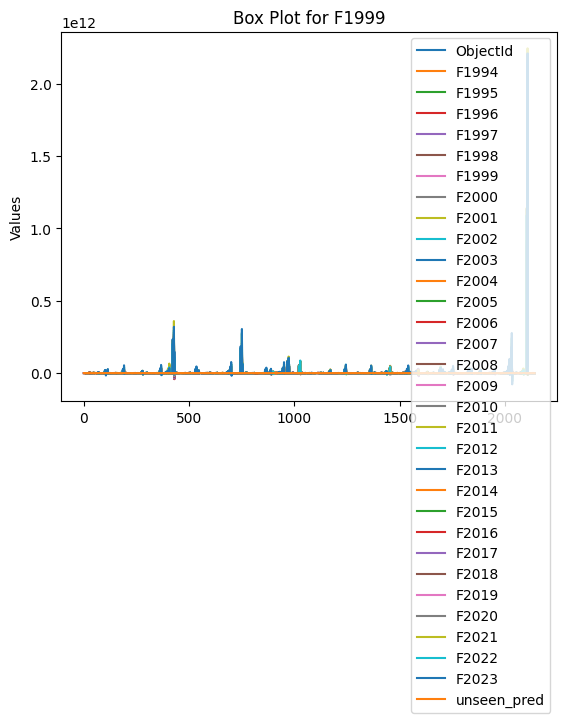

<Figure size 640x480 with 0 Axes>

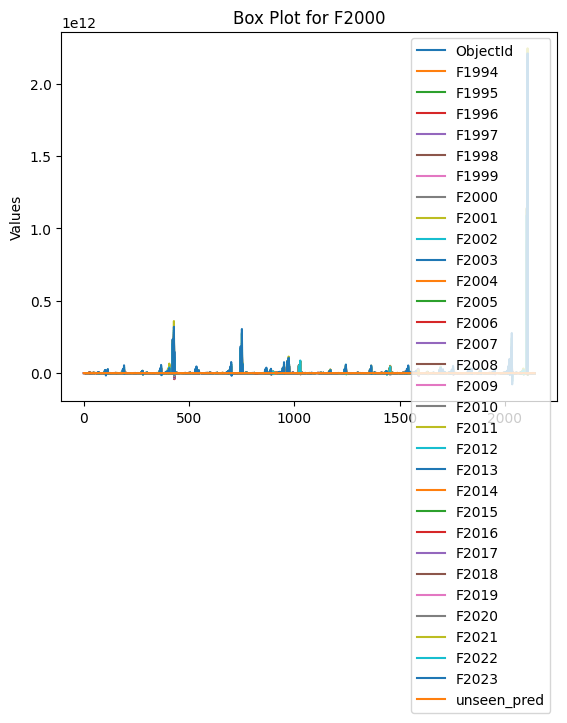

<Figure size 640x480 with 0 Axes>

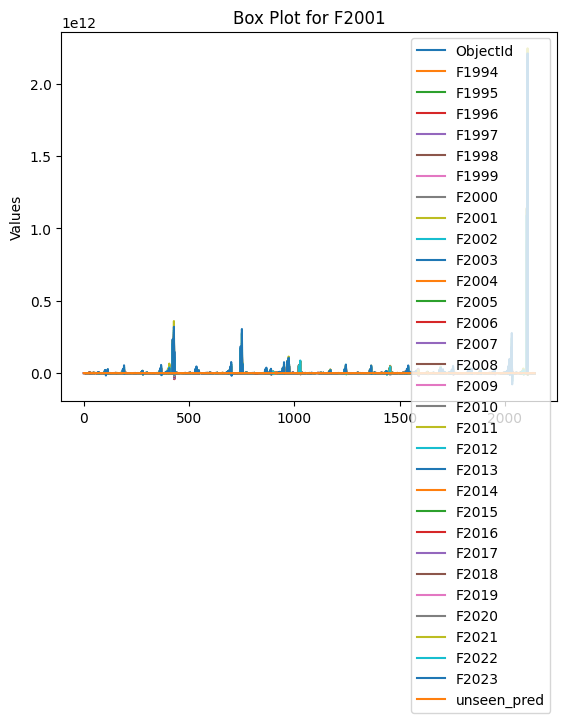

<Figure size 640x480 with 0 Axes>

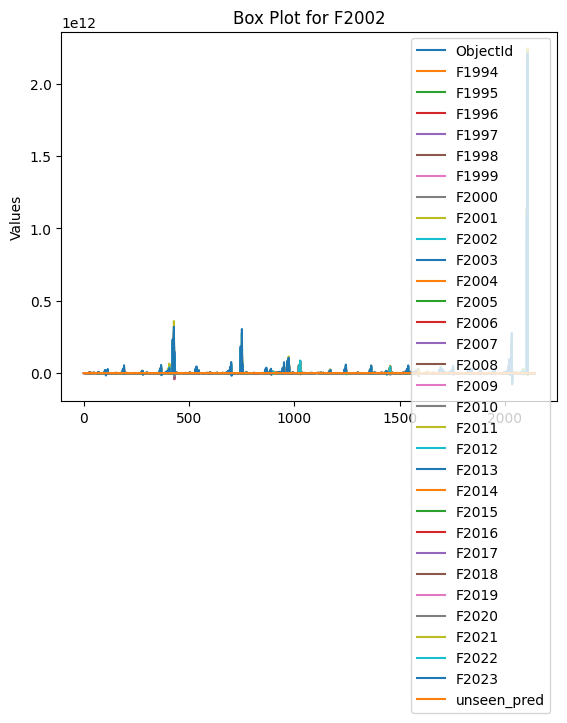

<Figure size 640x480 with 0 Axes>

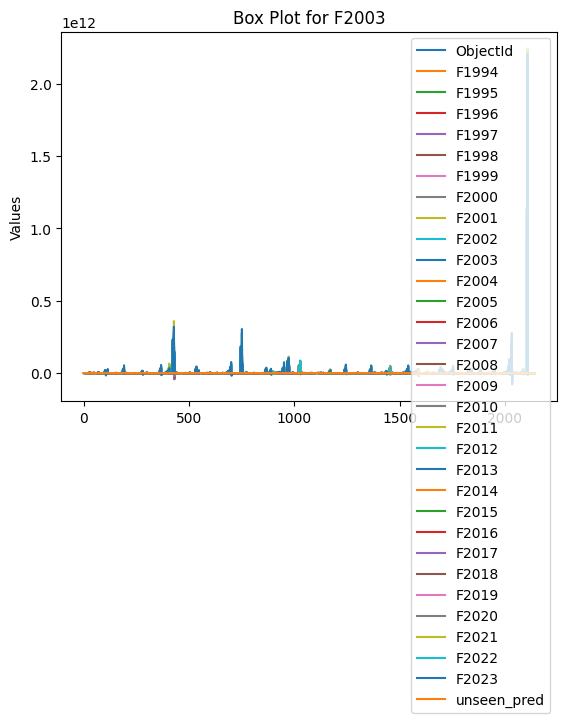

<Figure size 640x480 with 0 Axes>

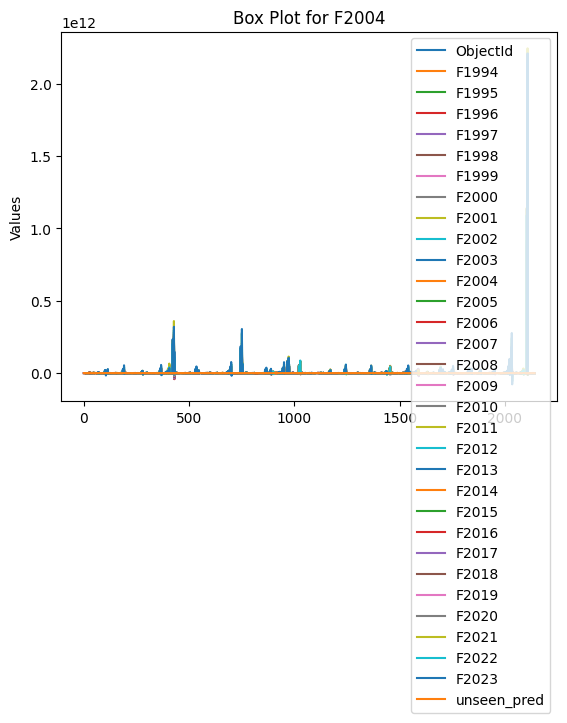

<Figure size 640x480 with 0 Axes>

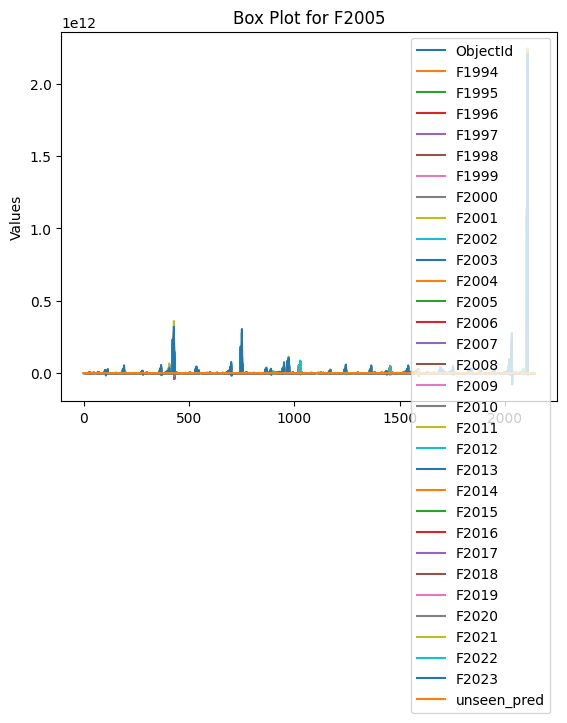

<Figure size 640x480 with 0 Axes>

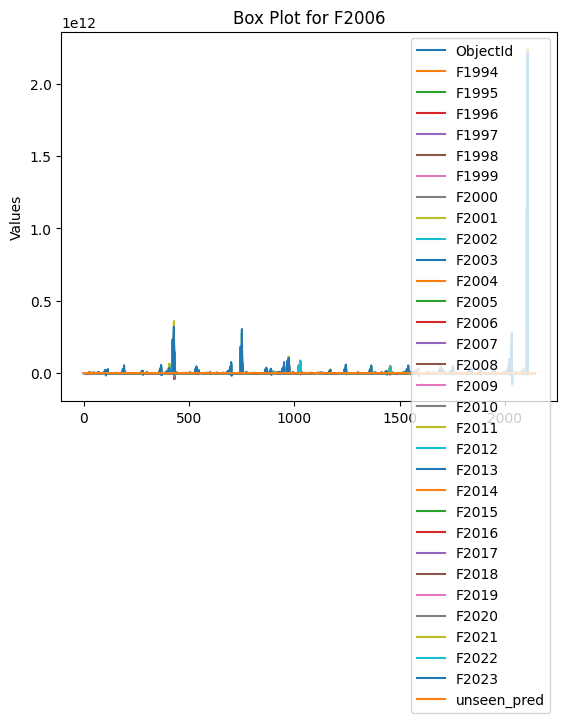

<Figure size 640x480 with 0 Axes>

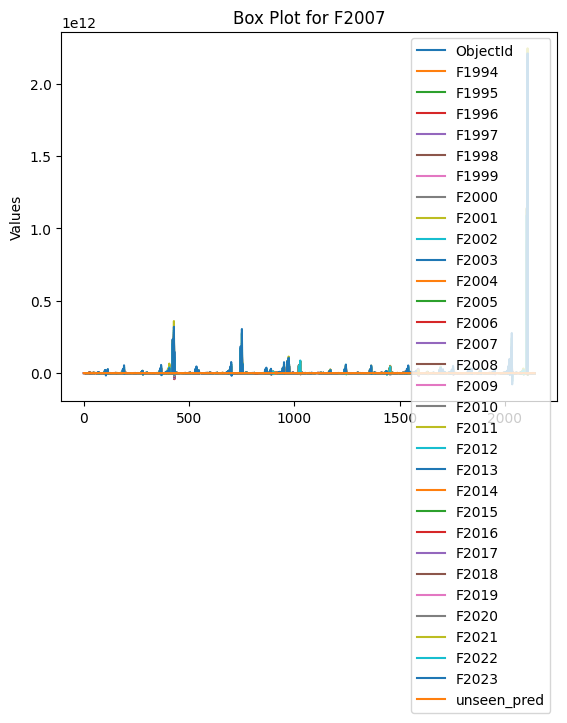

<Figure size 640x480 with 0 Axes>

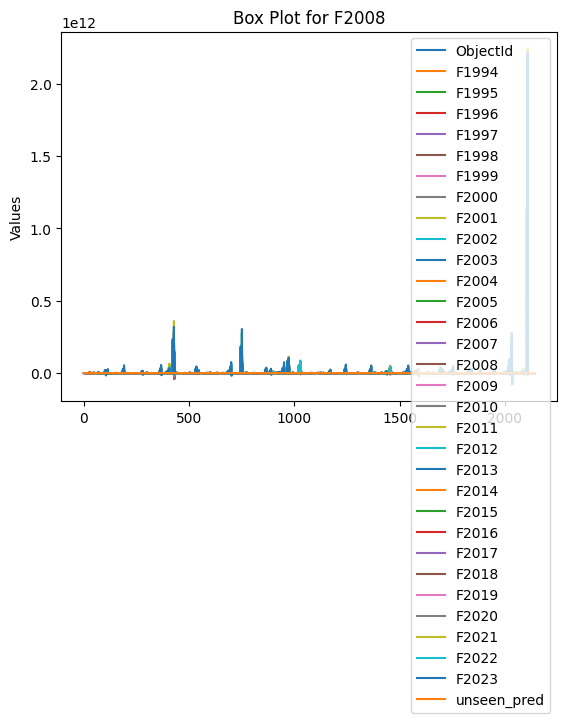

<Figure size 640x480 with 0 Axes>

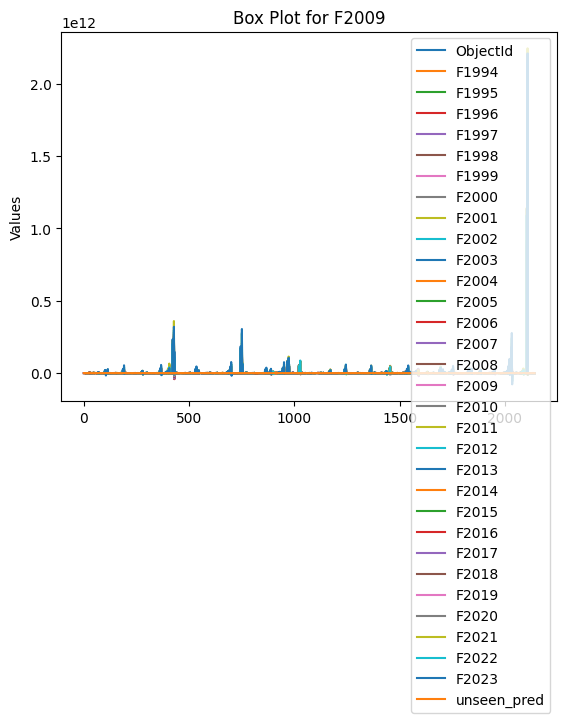

<Figure size 640x480 with 0 Axes>

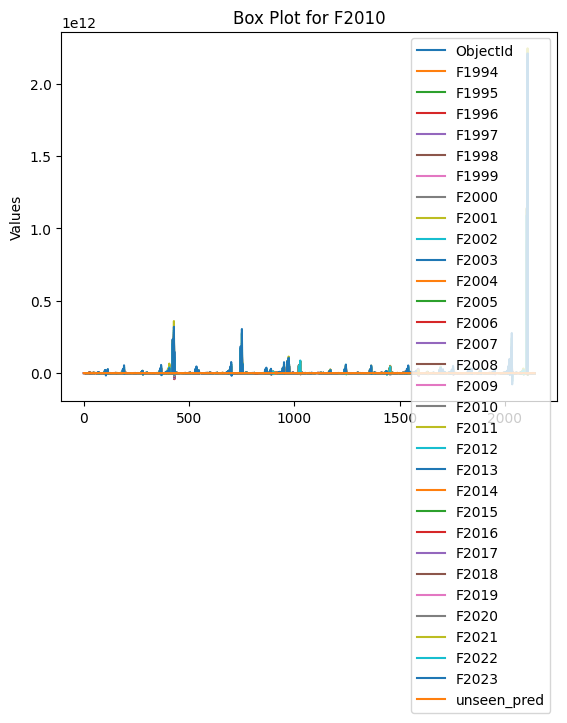

<Figure size 640x480 with 0 Axes>

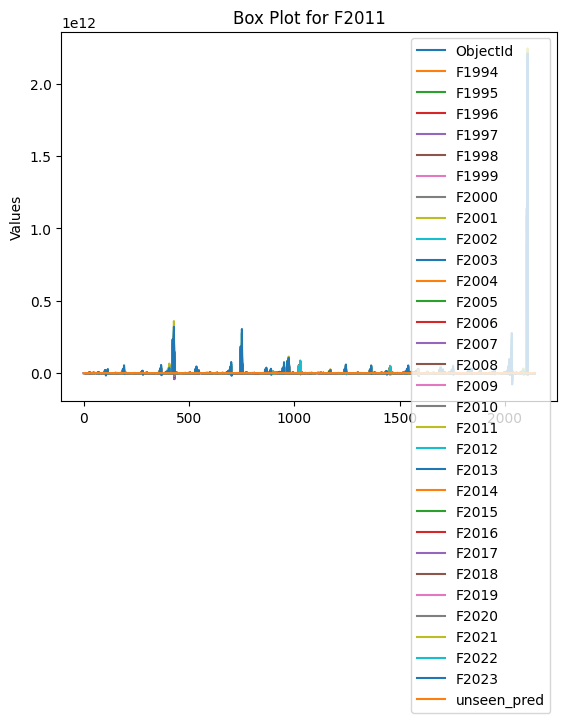

<Figure size 640x480 with 0 Axes>

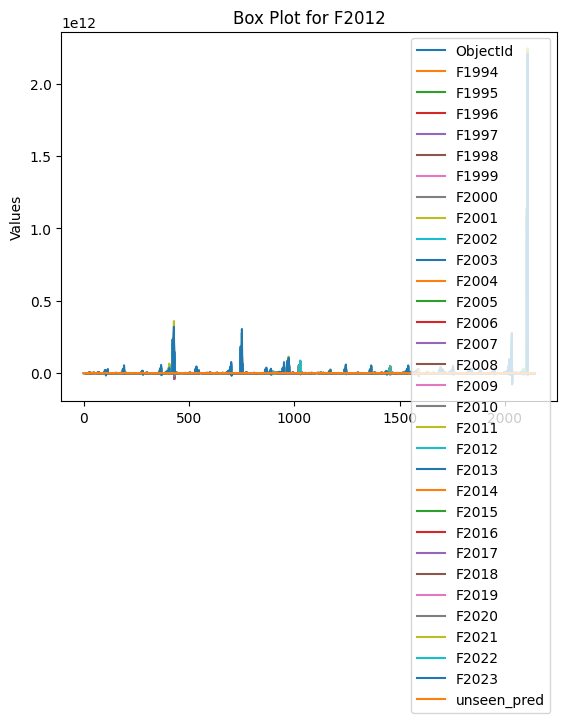

<Figure size 640x480 with 0 Axes>

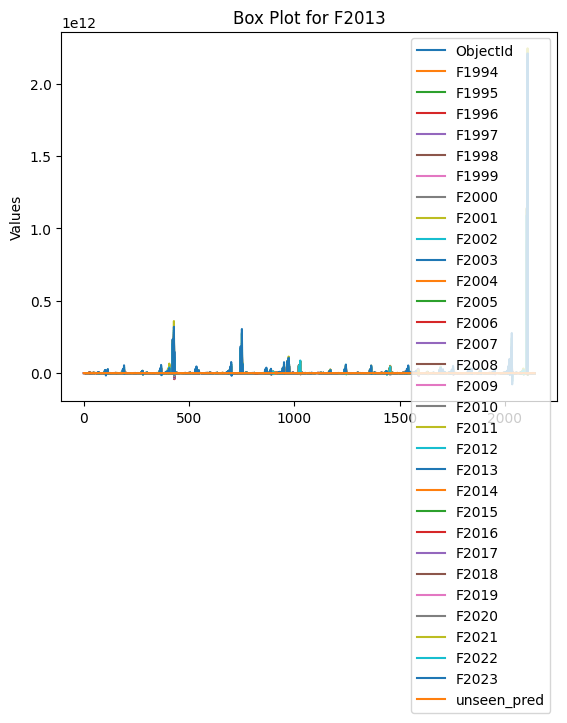

<Figure size 640x480 with 0 Axes>

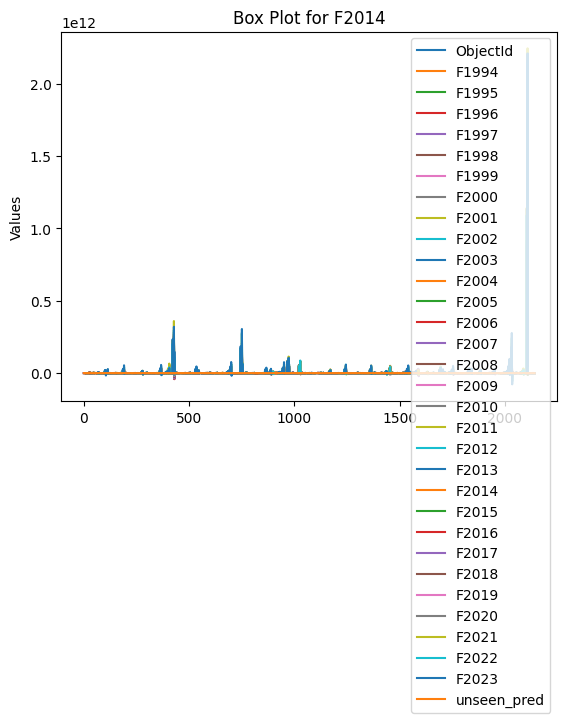

<Figure size 640x480 with 0 Axes>

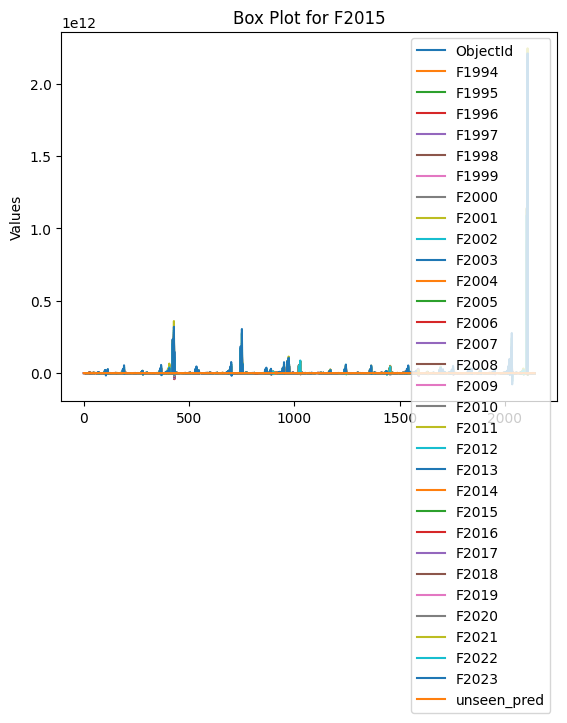

<Figure size 640x480 with 0 Axes>

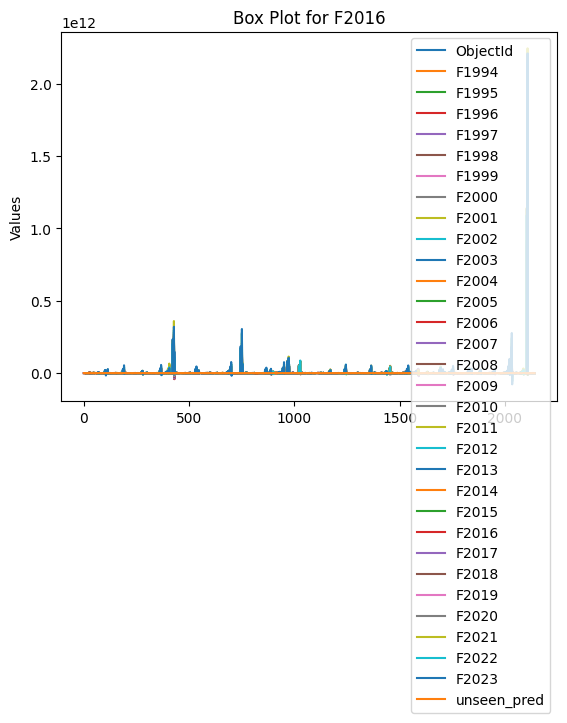

<Figure size 640x480 with 0 Axes>

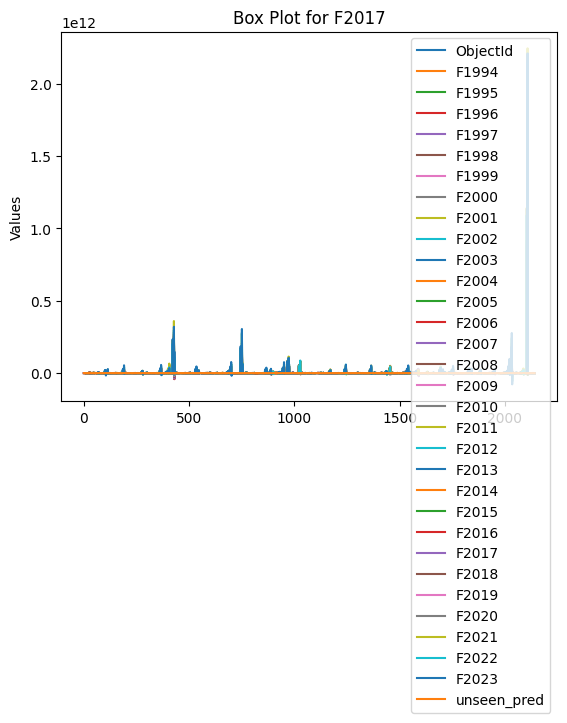

<Figure size 640x480 with 0 Axes>

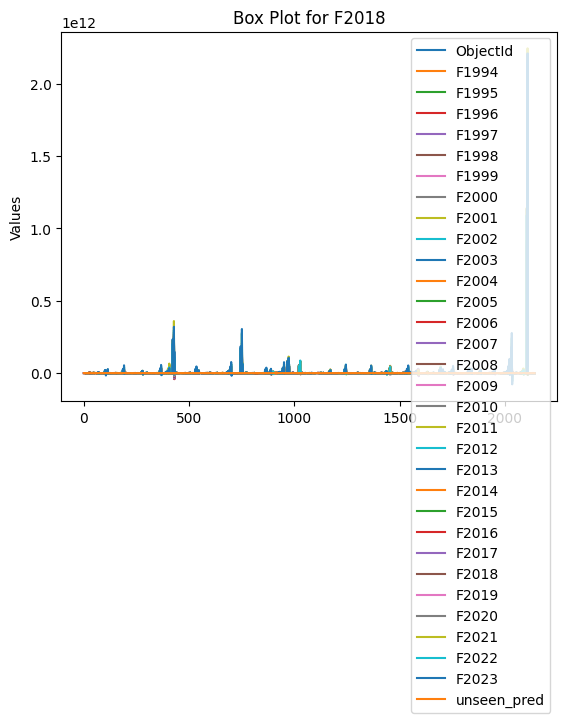

<Figure size 640x480 with 0 Axes>

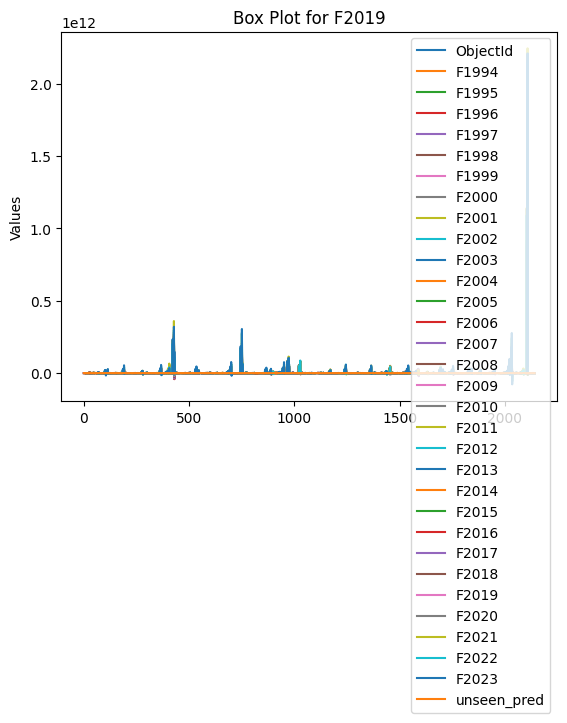

<Figure size 640x480 with 0 Axes>

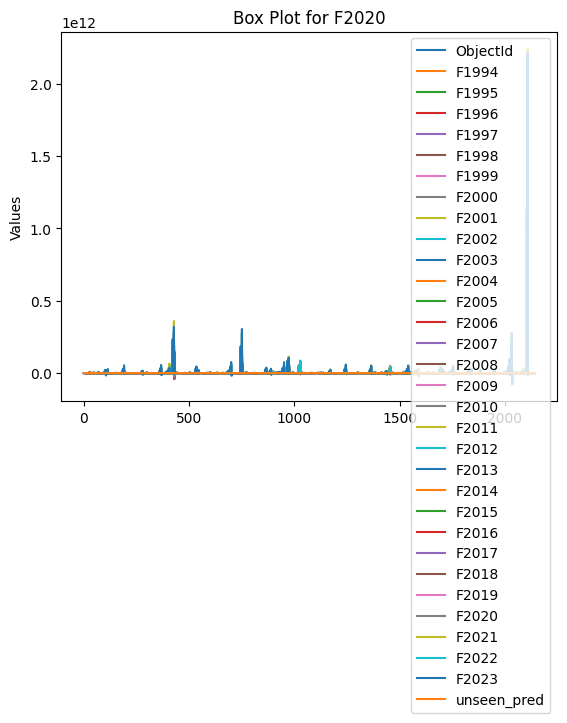

<Figure size 640x480 with 0 Axes>

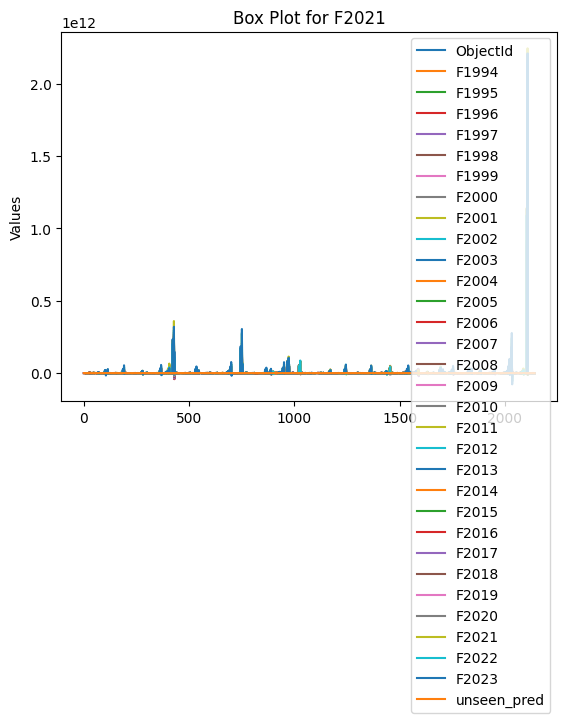

<Figure size 640x480 with 0 Axes>

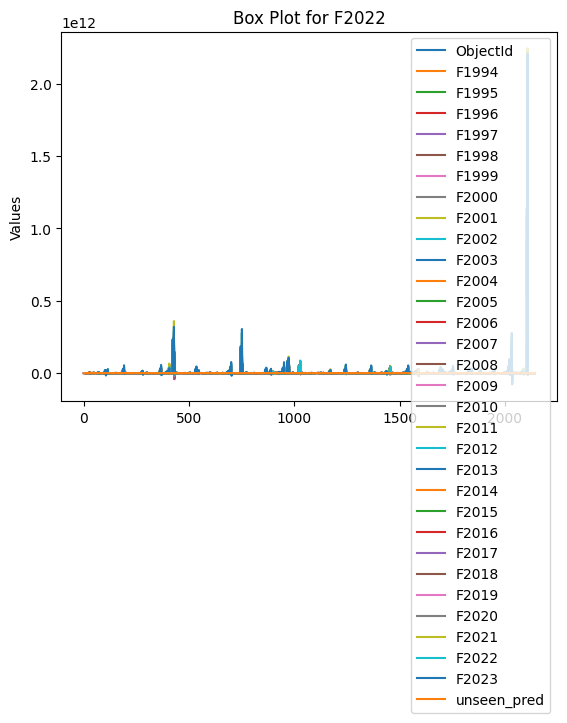

<Figure size 640x480 with 0 Axes>

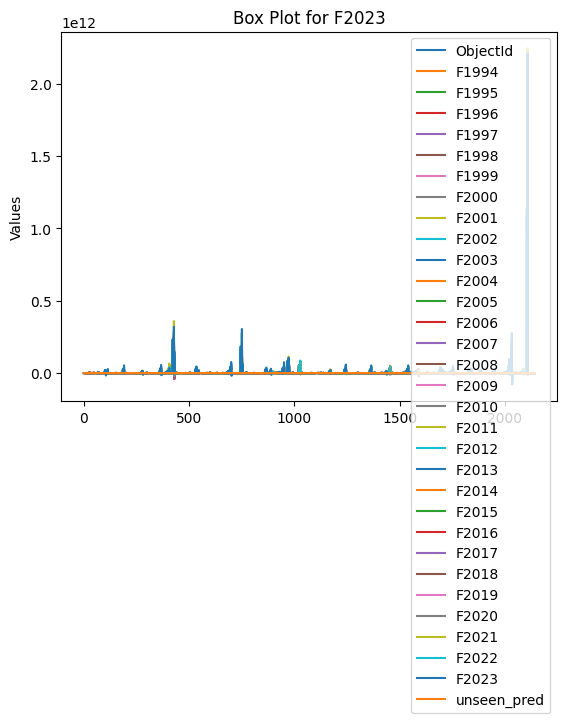

<Figure size 640x480 with 0 Axes>

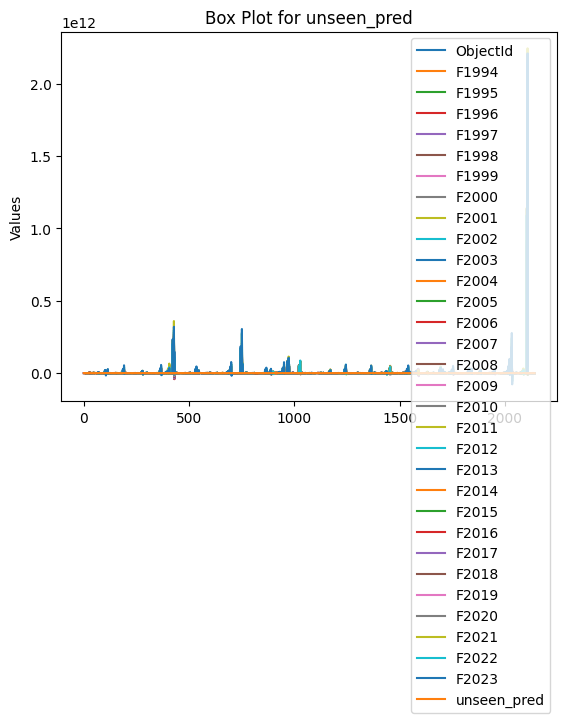

In [34]:
# forloop
# Create box plots for numerical columns using a for loop
for column in numeric_columns.columns:
    plt.figure()  # Create a new figure for each plot
    numeric_columns.plot(column=column)
    plt.title(f"Box Plot for {column}")
    plt.ylabel("Values")
    plt.show()

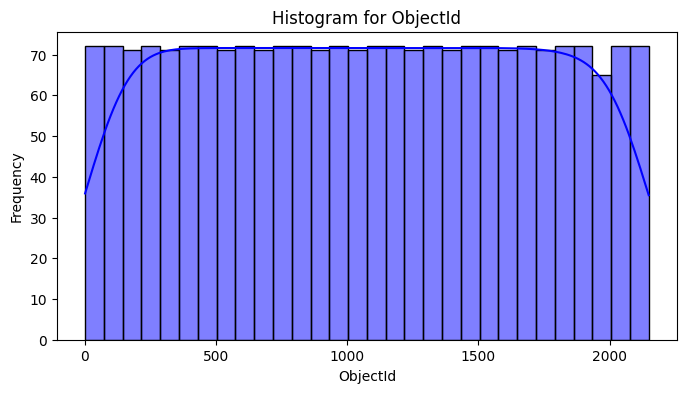

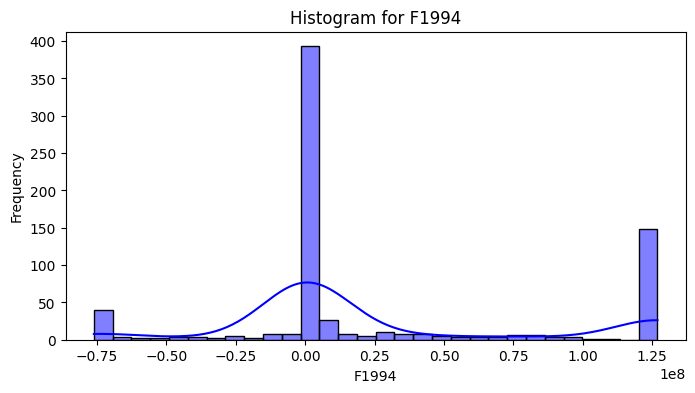

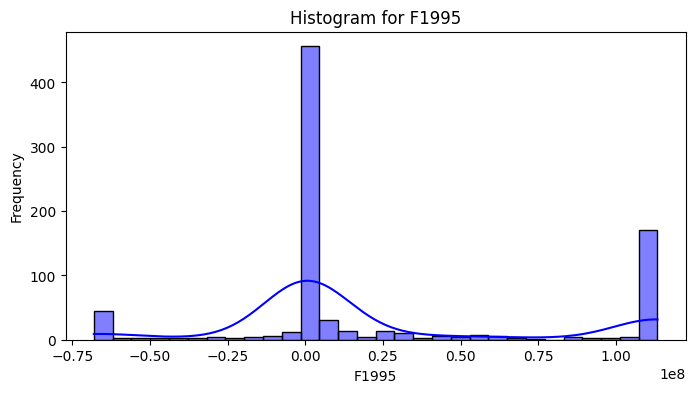

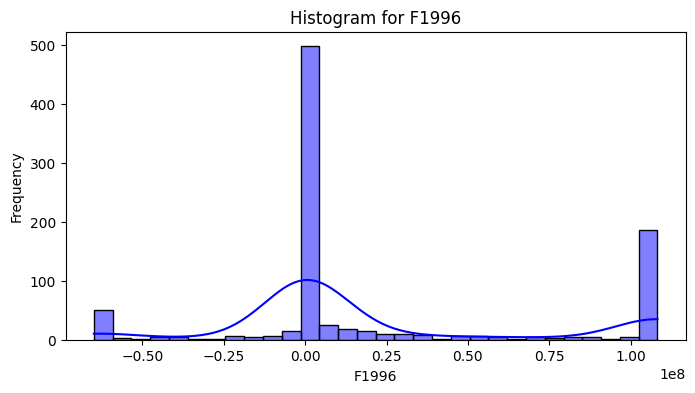

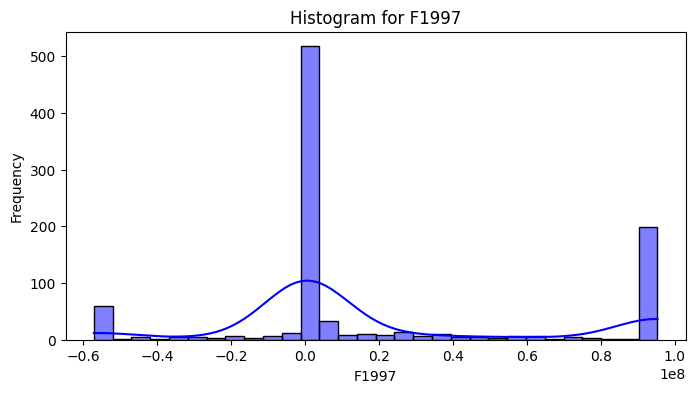

...

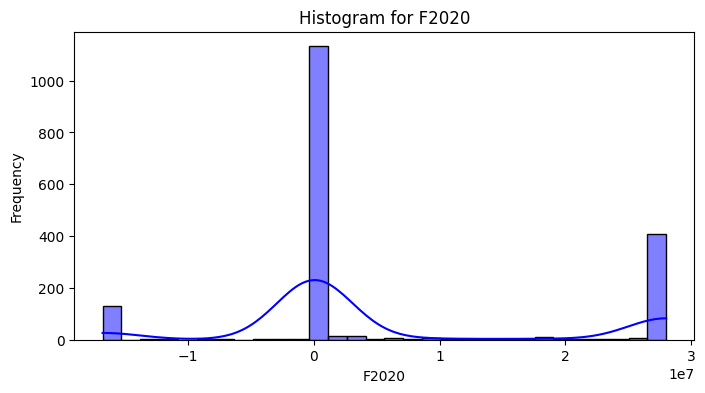

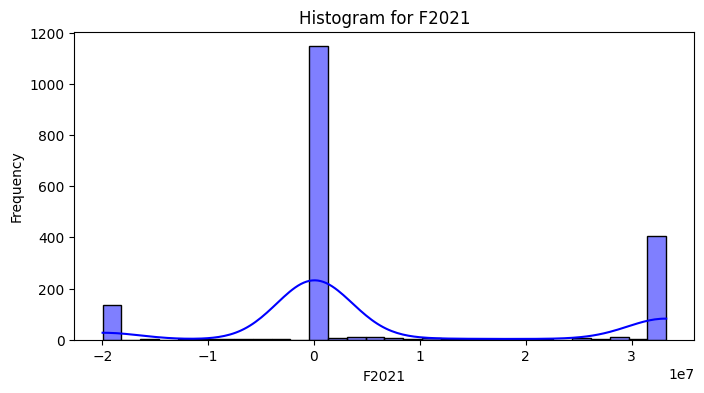

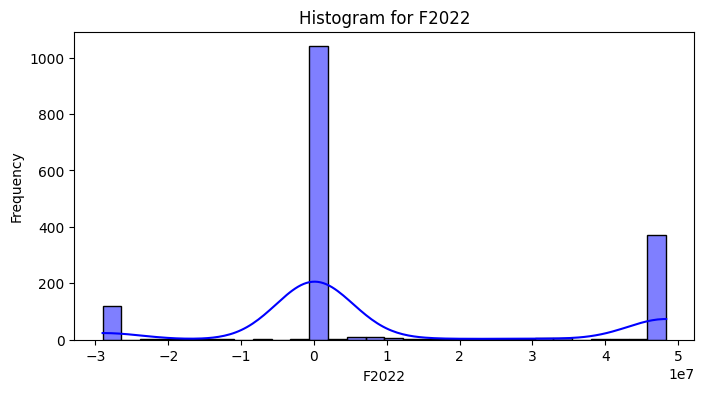

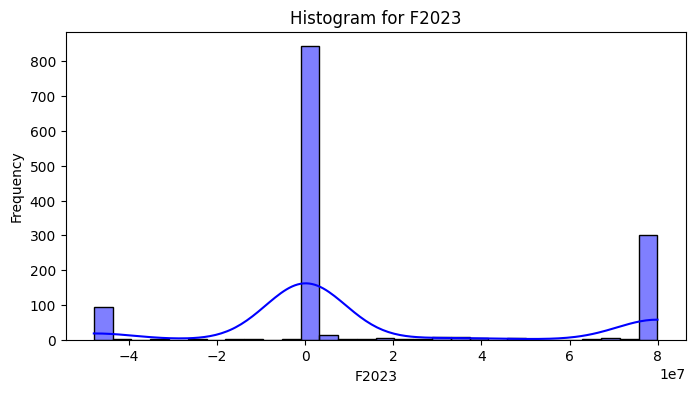

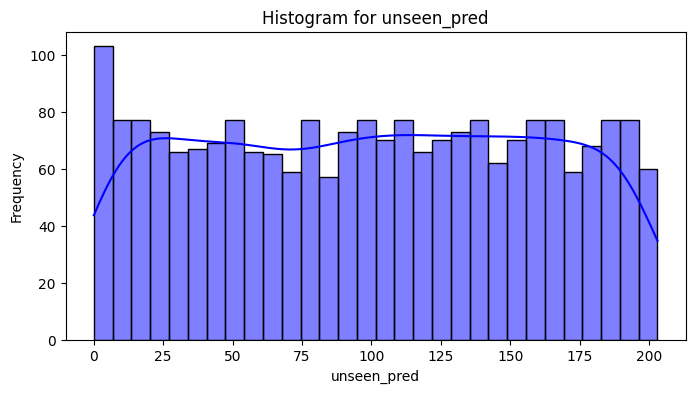

In [35]:
for column in numeric_columns:
    plt.figure(figsize=(8, 4))  # Set figure size
    sns.histplot(data=path_df, x=column, kde=True, bins=30,color='blue')  # Histogram with KDE
    plt.title(f"Histogram for {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

In [36]:
# Check skewness of numerical columns
numerical_features = path_df1.select_dtypes(include=['float64', 'int64']).columns
#numerical_features
print(path_df1[numerical_features].skew())

F1994         -0.161501
F1995         -0.166081
F1996         -0.164023
F1997         -0.138632
F1998         -0.261970
F1999         -0.279533
F2000         -0.279244
F2001         -0.274095
F2002         -0.290474
F2003         -0.295058
F2004         -0.290789
F2005         -0.297736
F2006         -0.291794
F2007         -0.288774
F2008         -0.309458
F2009         -0.299196
F2010         -0.299056
F2011         -0.303155
F2012         -0.310904
F2013         -0.330889
F2014         -0.321122
F2015         -0.315800
F2016         -0.300109
F2017         -0.302295
F2018         -0.298077
F2019         -0.303021
F2020         -0.289453
F2021         -0.282374
F2022         -0.284655
F2023         -0.288603
unseen_pred   -0.312487
dtype: float64


In [37]:
sns.pairplot(path_df1)

In [38]:
categorical_columns = path_df1.select_dtypes(include=['float64', 'object']).columns
categorical_columns

Index(['Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source', 'CTS_Code',
       'CTS_Name', 'CTS_Full_Descriptor', 'Trade_Flow', 'Scale', 'F1994',
       'F1995', 'F1996', 'F1997', 'F1998', 'F1999', 'F2000', 'F2001', 'F2002',
       'F2003', 'F2004', 'F2005', 'F2006', 'F2007', 'F2008', 'F2009', 'F2010',
       'F2011', 'F2012', 'F2013', 'F2014', 'F2015', 'F2016', 'F2017', 'F2018',
       'F2019', 'F2020', 'F2021', 'F2022', 'F2023', 'unseen_pred'],
      dtype='object')

Text(0.5, 1.0, 'Correlation Heatmap')

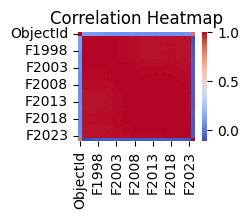

In [39]:
# heatmap
plt.subplot(3, 3, 2)

# Select only numerical columns
numerical_data = data.select_dtypes(include=['float64', 'int64'])

# Compute and plot the heatmap
sns.heatmap(numerical_data.corr(), cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap')


In [40]:
print(data.columns)


Index(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
       'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor', 'Trade_Flow', 'Scale',
       'F1994', 'F1995', 'F1996', 'F1997', 'F1998', 'F1999', 'F2000', 'F2001',
       'F2002', 'F2003', 'F2004', 'F2005', 'F2006', 'F2007', 'F2008', 'F2009',
       'F2010', 'F2011', 'F2012', 'F2013', 'F2014', 'F2015', 'F2016', 'F2017',
       'F2018', 'F2019', 'F2020', 'F2021', 'F2022', 'F2023', 'unseen_pred'],
      dtype='object')


<function matplotlib.pyplot.show(close=None, block=None)>

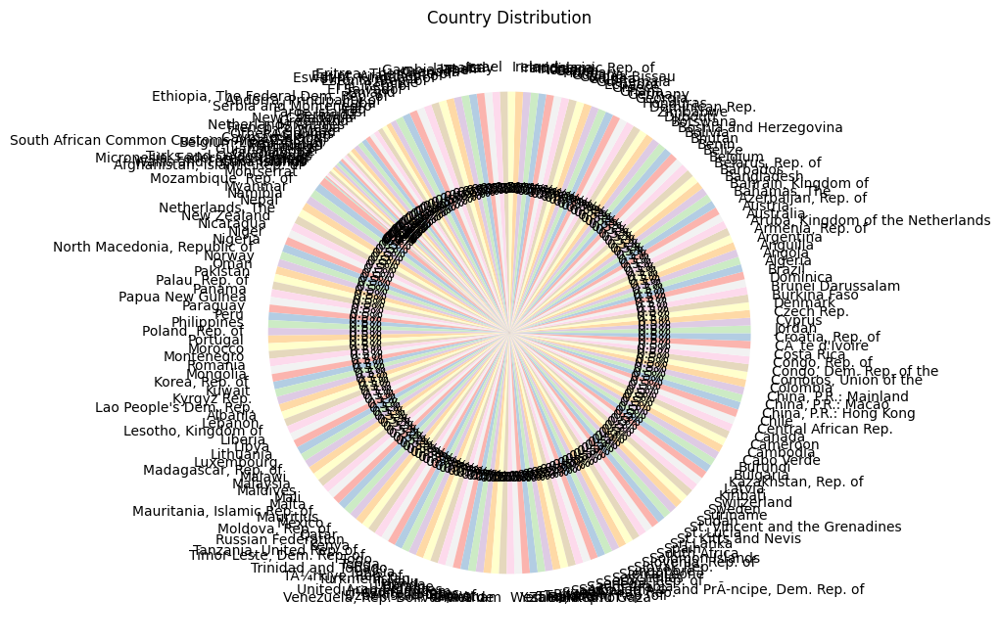

In [41]:
 #Pie Chart for Country Distribution
plt.figure(figsize=(8, 8))
Country_counts = path_df['Country'].value_counts()
plt.pie(Country_counts, labels=Country_counts.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Pastel1.colors )
plt.title('Country Distribution')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

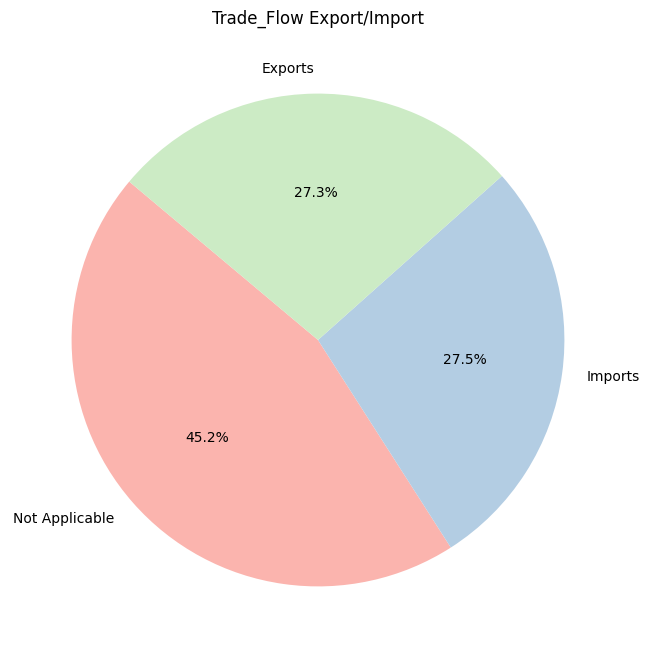

In [42]:
 #Pie Chart for Trade_Flow Export / Import
plt.figure(figsize=(8, 8))
Trade_Flow = path_df['Trade_Flow'].value_counts()
plt.pie(Trade_Flow, labels=Trade_Flow.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Pastel1.colors )
plt.title('Trade_Flow Export/Import')
plt.show

<Axes: xlabel='ObjectId', ylabel='Density'>

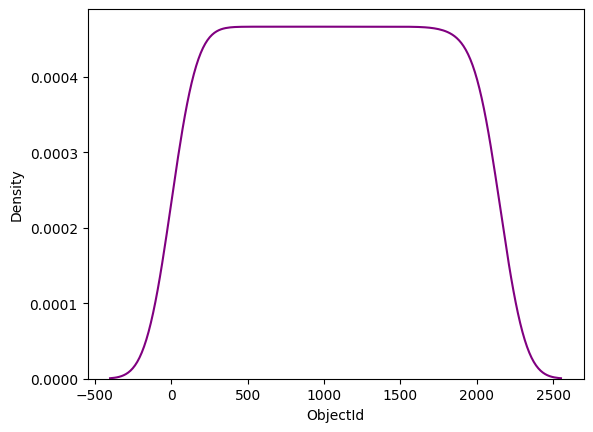

In [43]:
sns.kdeplot(path_df['ObjectId'],color='purple')

In [44]:
X = path_df.drop('ObjectId', axis=1)
y = path_df['ObjectId']

from sklearn.preprocessing import LabelEncoder


y = path_df['ObjectId']

# Initialize and apply the LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(path_df.head())

   ObjectId                       Country ISO2 ISO3  \
0         1  Afghanistan, Islamic Rep. of   AF  AFG   
1         2  Afghanistan, Islamic Rep. of   AF  AFG   
2         3  Afghanistan, Islamic Rep. of   AF  AFG   
3         4  Afghanistan, Islamic Rep. of   AF  AFG   
4         5  Afghanistan, Islamic Rep. of   AF  AFG   

                                           Indicator        Unit  \
0  Comparative advantage in low carbon technology...       Index   
1          Exports of low carbon technology products  US Dollars   
2  Exports of low carbon technology products as p...     Percent   
3  Exports of low carbon technology products as s...     Percent   
4          Imports of low carbon technology products  US Dollars   

                                              Source CTS_Code  \
0  Department of Economic and Social Affairs/Unit...   ECBTLA   
1  Department of Economic and Social Affairs/Unit...   ECBTLX   
2  Department of Economic and Social Affairs/Unit...   ECBTLX   


In [45]:
y

array([   0,    1,    2, ..., 2140, 2141, 2142])

In [46]:
x = data['ObjectId']

In [47]:
X.isnull().sum()

,0
Country,0
ISO2,0
ISO3,0
Indicator,0
Unit,0
Source,0
CTS_Code,0
CTS_Name,0
CTS_Full_Descriptor,0
Trade_Flow,0


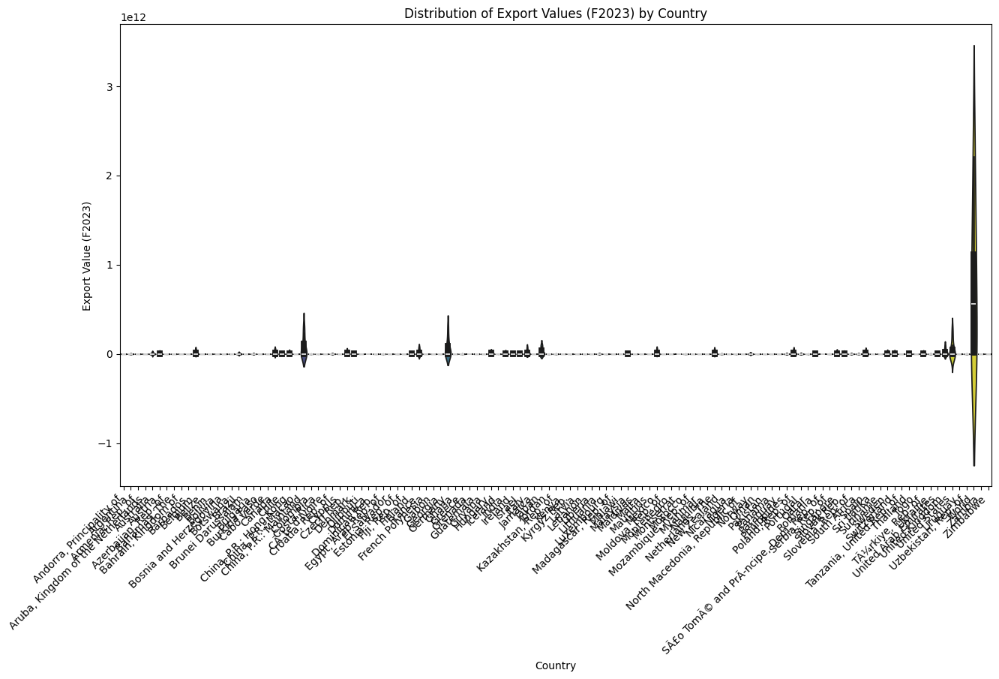

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data for valid rows (drop missing values in relevant columns)
filtered_data = data[['Country', 'F2023']].dropna()

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(x='Country', y='F2023', data=filtered_data, palette='viridis')
plt.title('Distribution of Export Values (F2023) by Country')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Export Value (F2023)')
plt.xlabel('Country')
plt.show()


 FEATURE ENGINEERING

In [49]:
X = path_df1.drop('Country', axis=1)
y = path_df1['Country']

# Encode the target variable (Country)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)  # <=50K -> 0, >50K -> 1

In [50]:
y

array([  0,   0,   0, ..., 209, 209, 209])

In [51]:
X

,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,Trade_Flow,Scale,...,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2023,unseen_pred
0,AF,AFG,Comparative advantage in low carbon technology...,Index,Department of Economic and Social Affairs/Unit...,ECBTLA,Trade in Low Carbon Technology Products; Compa...,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,Units,...,NaN,NaN,-0.278465,-0.276358,-0.277966,NaN,NaN,NaN,NaN,-1.946127
1,AF,AFG,Exports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",Exports,Units,...,NaN,NaN,-0.278113,-0.276060,-0.276577,NaN,NaN,NaN,NaN,-1.946127
2,AF,AFG,Exports of low carbon technology products as p...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",Exports,Units,...,NaN,NaN,-0.278465,-0.276358,-0.277966,NaN,NaN,NaN,NaN,-1.946127
3,AF,AFG,Exports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",Exports,Units,...,NaN,NaN,-0.278465,-0.276358,-0.277966,NaN,NaN,NaN,NaN,-1.946127
4,AF,AFG,Imports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",Imports,Units,...,0.241846,0.244383,1.092256,1.179032,1.474624,NaN,NaN,NaN,NaN,-1.946127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,ZW,ZWE,Imports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",Imports,Units,...,-0.280916,-0.278565,-0.278464,-0.276358,-0.277966,-0.274164,-0.268105,-0.271205,-0.272579,1.541635
2139,ZW,ZWE,Total trade in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,Units,...,1.484561,1.484210,1.473669,1.472087,1.474624,1.470100,1.475388,1.474191,1.478387,1.541635
2140,ZW,ZWE,Total trade in low carbon technology products ...,Percent,Department of Economic and Social Affairs/Unit...,ECBTL,Trade in Low Carbon Technology Products,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,Units,...,-0.280917,-0.278566,-0.278465,-0.276358,-0.277966,-0.274165,-0.268105,-0.271205,-0.272579,1.541635
2141,ZW,ZWE,Trade balance in low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLB,Trade in Low Carbon Technology Products; Trade...,"Environment, Climate Change, Mitigation, Trade...",Not Applicable,Units,...,-2.509600,-2.458802,-2.436529,-2.425976,-2.454066,-2.396374,-2.369946,-2.387798,-2.415843,1.541635


In [52]:
X.isnull().sum()

,0
ISO2,0
ISO3,0
Indicator,0
Unit,0
Source,0
CTS_Code,0
CTS_Name,0
CTS_Full_Descriptor,0
Trade_Flow,0
Scale,0


In [53]:
numeric_col=X.select_dtypes(include=['number']).columns

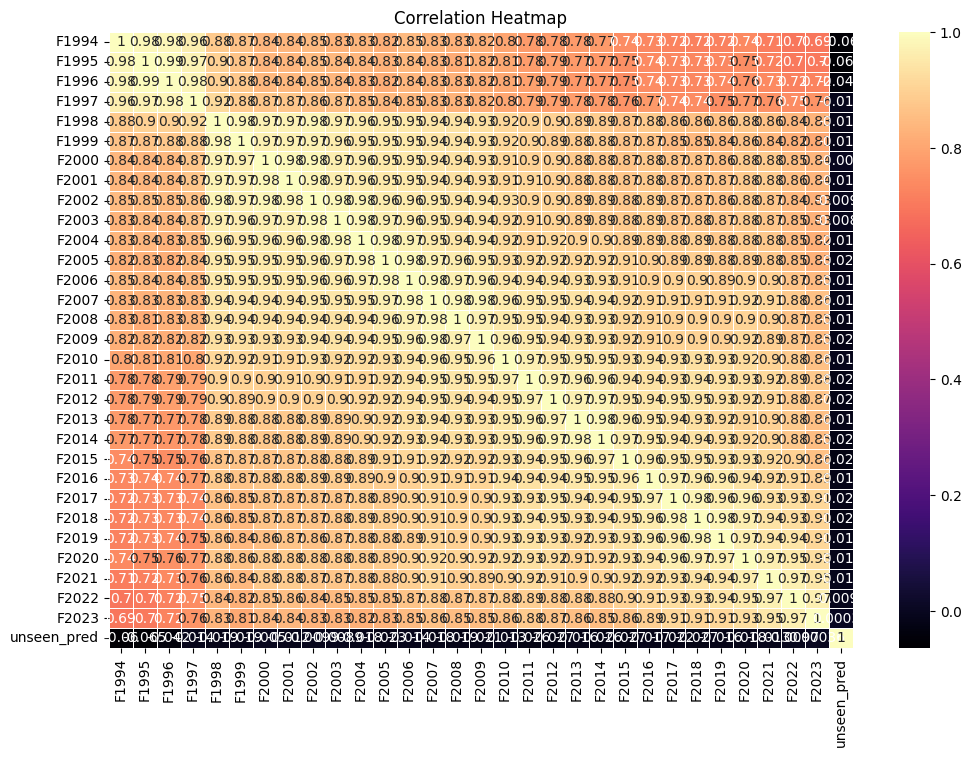

In [54]:
correlation_matrix = X[numeric_col].corr()
plt.figure(figsize=(12, 8))

sns.heatmap(correlation_matrix, annot=True, cmap='magma', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [55]:
# Make sure that 'path_df1' is correctly defined and populated before this line
X = path_df1.drop('Country', axis=1)  # Redefine X
categ_columns = X.select_dtypes(include=['object']).columns
print("categorical_columns:", categ_columns)

categorical_columns: Index(['ISO2', 'ISO3', 'Indicator', 'Unit', 'Source', 'CTS_Code', 'CTS_Name',
       'CTS_Full_Descriptor', 'Trade_Flow', 'Scale'],
      dtype='object')


In [56]:
# Perform one-hot encoding
X = pd.get_dummies(X, columns=categ_columns, drop_first=True)

# Verify the result
print("Shape of X after one-hot encoding:", X.shape)
print("First 5 rows of the transformed dataset:\n", X.head())

Shape of X after one-hot encoding: (2143, 464)
First 5 rows of the transformed dataset:
    F1994  F1995  F1996  F1997  F1998  F1999  F2000  F2001  F2002  F2003  ...  \
0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  ...   
1    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  ...   
2    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  ...   
3    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  ...   
4    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  ...   

   CTS_Name_Trade in Low Carbon Technology Products; Comparative Advantage  \
0                                               True                         
1                                              False                         
2                                              False                         
3                                              False                         
4                                       

In [57]:
# Check data types of all columns
print(X.dtypes)

# Ensure no columns are categorical anymore
if X.select_dtypes(include='object').empty:
    print("All columns are now numeric!")

F1994                                                                                                                                 float64
F1995                                                                                                                                 float64
F1996                                                                                                                                 float64
F1997                                                                                                                                 float64
F1998                                                                                                                                 float64
                                                                                                                                       ...   
CTS_Full_Descriptor_Environment, Climate Change, Mitigation, Trade-Related, Trade in Low Carbon Technology Products, Exports             bool
CTS_Fu

In [58]:
X.isnull().sum()

,0
F1994,1423
F1995,1313
F1996,1235
F1997,1195
F1998,772
...,...
"CTS_Full_Descriptor_Environment, Climate Change, Mitigation, Trade-Related, Trade in Low Carbon Technology Products, Exports",0
"CTS_Full_Descriptor_Environment, Climate Change, Mitigation, Trade-Related, Trade in Low Carbon Technology Products, Imports",0
"CTS_Full_Descriptor_Environment, Climate Change, Mitigation, Trade-Related, Trade in Low Carbon Technology Products, Trade Balance",0
Trade_Flow_Imports,0


In [59]:
# Assuming 'path_df1' is your DataFrame and 'Country' is your target column
y = path_df1['Country']  # Define or re-define 'y' here

# Encode the target variable (Country)
from sklearn.preprocessing import LabelEncoder  # Make sure LabelEncoder is imported
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)


In [60]:
y  # Now you can use 'y'

array([  0,   0,   0, ..., 209, 209, 209])

# FEATURE SELECTION

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [62]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
# Train Random forest
rf = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=5)
rf.fit(X_train, y_train)


RandomForestClassifier(max_depth=5, random_state=42)

In [63]:
print(data)  # Data you're passing
print(len(data))  # Number of columns in the data
print(column)  # List of column names
print(len(column))  # Number of column names




      ObjectId                       Country ISO2 ISO3  \
0            1  Afghanistan, Islamic Rep. of   AF  AFG   
1            2  Afghanistan, Islamic Rep. of   AF  AFG   
2            3  Afghanistan, Islamic Rep. of   AF  AFG   
3            4  Afghanistan, Islamic Rep. of   AF  AFG   
4            5  Afghanistan, Islamic Rep. of   AF  AFG   
...        ...                           ...  ...  ...   
2138      2145                      Zimbabwe   ZW  ZWE   
2139      2146                      Zimbabwe   ZW  ZWE   
2140      2147                      Zimbabwe   ZW  ZWE   
2141      2148                      Zimbabwe   ZW  ZWE   
2142      2149                      Zimbabwe   ZW  ZWE   

                                              Indicator        Unit  \
0     Comparative advantage in low carbon technology...       Index   
1             Exports of low carbon technology products  US Dollars   
2     Exports of low carbon technology products as p...     Percent   
3     Exports of lo

In [64]:
# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame to visualize feature importance
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

print(feature_importances)

                       Feature  Importance
45                     ISO2_BD    0.014739
350                   ISO3_MDG    0.014619
41                     ISO2_AW    0.013235
385                   ISO3_PRY    0.012822
234                   ISO3_AFG    0.012771
..                         ...         ...
193                    ISO2_SD    0.000000
185                    ISO2_RE    0.000000
184                    ISO2_QA    0.000000
179                    ISO2_PL    0.000000
463  Trade_Flow_Not Applicable    0.000000

[464 rows x 2 columns]


In [65]:
from sklearn.feature_selection import SelectFromModel # Importing the SelectFromModel class

selector = SelectFromModel(rf, threshold=0.01)  # Select features above the mean importance
selector.fit(X_train, y_train)

# Transform data to keep selected features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Get the selected feature names
selected_features = X_train.columns[selector.get_support()]
print("\nSelected Features:", selected_features)


Selected Features: Index(['ISO2_AW', 'ISO2_BD', 'ISO2_JP', 'ISO2_PT', 'ISO2_PY', 'ISO2_TL',
       'ISO3_AFG', 'ISO3_BHR', 'ISO3_CHL', 'ISO3_COG', 'ISO3_MDG', 'ISO3_POL',
       'ISO3_PRY'],
      dtype='object')


In [66]:
X_train_selected

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [67]:
#scaling
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train_selected)
X_test_scaled=scaler.fit_transform(X_test_selected)

In [68]:
print("Training set shape (features):",X_train_selected.shape)
print("Test set shape(features):",X_test_selected.shape)
print("Training set shape(target):",y_train.shape)
print("Test set shape(target):",y_test.shape)

Training set shape (features): (1714, 13)
Test set shape(features): (429, 13)
Training set shape(target): (1714,)
Test set shape(target): (429,)


In [69]:
#convert back to DataFrame for easier handling
X_normalized_df=pd.DataFrame(X_train_scaled,columns=selected_features)
print(X_normalized_df.head())

    ISO2_AW   ISO2_BD   ISO2_JP   ISO2_PT   ISO2_PY   ISO2_TL  ISO3_AFG  \
0 -0.080369 -0.080369 -0.076606 -0.080369 -0.080369 -0.080369 -0.080369   
1 -0.080369 -0.080369 -0.076606 -0.080369 -0.080369 -0.080369 -0.080369   
2 -0.080369 -0.080369 -0.076606 -0.080369 -0.080369 -0.080369 -0.080369   
3 -0.080369 -0.080369 -0.076606 -0.080369 -0.080369 -0.080369 -0.080369   
4 -0.080369 -0.080369 -0.076606 -0.080369 -0.080369 -0.080369 -0.080369   

   ISO3_BHR  ISO3_CHL  ISO3_COG  ISO3_MDG  ISO3_POL  ISO3_PRY  
0 -0.080369 -0.080369 -0.080369 -0.076606 -0.076606 -0.080369  
1 -0.080369 -0.080369 -0.080369 -0.076606 -0.076606 -0.080369  
2 -0.080369 -0.080369 -0.080369 -0.076606 -0.076606 -0.080369  
3 -0.080369 -0.080369 -0.080369 -0.076606 -0.076606 -0.080369  
4 -0.080369 -0.080369 -0.080369 -0.076606 -0.076606 -0.080369  


In [ ]:
#after converting into dataframe,recheck shape of trained model

In [ ]:
print("Training set shape (features):",X_train_scaled.shape)
print("Test set shape(features):",X_test_scaled.shape)
print("Training set shape(target):",y_train.shape)
print("Test set shape(target):",y_test.shape)

Training set shape (features): (1714, 13)
Test set shape(features): (429, 13)
Training set shape(target): (1714,)
Test set shape(target): (429,)


TRAINING MODELS

In [70]:
!pip install scikit-learn
from sklearn.linear_model import LogisticRegression # Import LogisticRegression

#Import other necessary libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier


print("\nTraining models...")
models = {
    'LogisticRegression': LogisticRegression(),
    'DecisionTreeClassifier': DecisionTreeClassifier(random_state=42, max_depth=5),
    'RandomForestClassifier': RandomForestClassifier(n_estimators=100,
                               max_depth=10,
                               random_state=42),
    'GradientBoostingClassifier': GradientBoostingClassifier(n_estimators=100,
                                    learning_rate=0.1,
                                    max_depth=3,
                                    random_state=42),

    'SVC': SVC(),
    'AdaBoostClassifier': AdaBoostClassifier(),
    'KNeighborsClassifier': KNeighborsClassifier(n_neighbors=5),

    "Bagging classifier": BaggingClassifier(
    KNeighborsClassifier(n_neighbors=2, weights='distance'),
    oob_score=True,
    max_samples=0.5,
    max_features=1.0,
    )
}


Training models...


MODEL EVALUATION

In [ ]:
#calculate matrix values of each models using for loop

In [71]:
# Change the max_features parameter to the number of features in your dataset
# Replace 'num_features' with the actual number of features in X_train_scaled
num_features = X_train_scaled.shape[1]

models = {
    # ... (other models)
    "Bagging classifier": BaggingClassifier(
        DecisionTreeClassifier(random_state=42),  # Use DecisionTreeClassifier
        oob_score=False,
        max_samples=0.5,
        max_features=num_features,
    )
}

In [73]:
# Initialize the results dictionary
results = {}

for name, model in models.items():
    print(f"Training model: {name}...")

    # Train the model
    model.fit(X_train_scaled, y_train)

    # Make predictions
    y_pred = model.predict(X_test_scaled)

    # Model evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')


    # Store results in the dictionary
    results[name] = {
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1
    }


Training model: Bagging classifier...


In [74]:
# Convert results to a DataFrame for better visualization
results_df = pd.DataFrame(results).T  # Transpose to make models as rows
print("Model Evaluation Results:")
print(results_df)

Model Evaluation Results:
                    Accuracy  Precision    Recall  F1 Score
Bagging classifier  0.009324   0.016588  0.022099    0.0166


In [75]:
#finding best model from the model list based on accuracy
best_model_name = max(results.items(), key=lambda x: x[1]['Accuracy'])[0]
best_model = models[best_model_name]
print(f"\nBest Model: {best_model_name}")


Best Model: Bagging classifier


CONFUSION MATRIX

In [76]:
from IPython import get_ipython
from IPython.display import display
# %%
# Import essential libraries for data manipulation, machine learning, and evaluation
import pandas as pd         # For data handling and manipulation
import numpy as np          # For numerical operations
import matplotlib.pyplot as plt  # For plotting and visualizations
import seaborn as sns       # For better visualization with seaborn
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score,classification_report, roc_auc_score,roc_curve, confusion_matrix # Import confusion_matrix here
import warnings
warnings.filterwarnings("ignore")# to prevent warning msgs

# Import machine learning libraries
from sklearn.model_selection import train_test_split  # For splitting the dataset into train and test sets
from sklearn.preprocessing import StandardScaler      # For scaling features
from sklearn.ensemble import RandomForestRegressor     # For regression model (Random Forest)
from sklearn.metrics import mean_squared_error, r2_score  # For model evaluation (RMSE, R²)
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier



In [77]:
results={}
for name,model in models.items():
    print(f"Training names:{name}...")
    model.fit(X_train_scaled,y_train)
    y_pred=model.predict(X_test_scaled)
    #model Evaluation
    cm = confusion_matrix(y_test, y_pred)
    results[name]={

        'confusion_matrix': cm
    }

Training names:Bagging classifier...


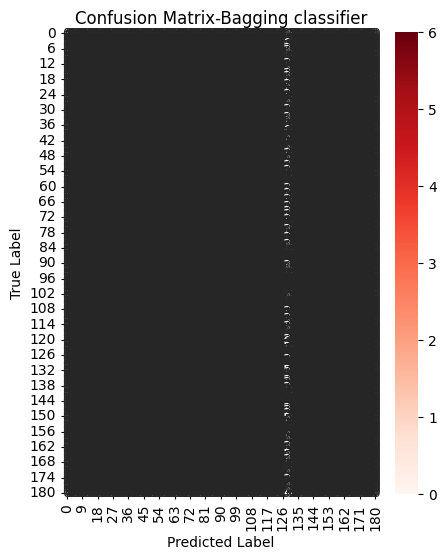

In [78]:
plt.figure(figsize=(5,6))
sns.heatmap(cm,annot=True,fmt='d',cmap='Reds')
plt.title(f'Confusion Matrix-{name}')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

ROC CURVE

In [79]:
#ROC SCORE AND ROC CURVE
# Initialize results dictionary
results = {}

# Iterate over models
for name, model in models.items():
    print(f"Training model: {name}...")

    # Train the model
    model.fit(X_train_scaled, y_train)

    # Predict test set labels
    y_pred = model.predict(X_test_scaled)

    # Predict probabilities for ROC-AUC
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_test_scaled)
       # Check if it's a binary or multi-class problem
        n_classes = len(np.unique(y_test))  # Get the number of unique classes in y_test

        # Initialize fpr and tpr here, so they are defined in all cases
        fpr = None
        tpr = None
        roc_auc = None

        if n_classes > 2:  # Multi-class
            # Ensure y_pred_prob has the correct number of columns
            if y_pred_prob.shape[1] != n_classes:
                print(f"Warning: {name} predicted probabilities have {y_pred_prob.shape[1]} columns, but y_test has {n_classes} unique classes.")
                # You might need to adjust your model or encoding to fix this mismatch
                # For now, we'll skip ROC-AUC calculation for this model
                continue
            roc_auc = roc_auc_score(y_test, y_pred_prob, multi_class='ovr', average='weighted')
        else:  # Binary
            roc_auc = roc_auc_score(y_test, y_pred_prob[:, 1])
    else:
        print(f"{name} does not support predict_proba(). Skipping ROC-AUC evaluation.")
        continue

    # Model evaluation: ROC-AUC  # This block was incorrectly indented

    print(f"ROC-AUC Score for {name}: {roc_auc:.2f}") # Added the closing double quote

    # For multi-class, we need to calculate per class
    if n_classes > 2:
        # Compute ROC curve for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_prob[:, i], pos_label=i)
            roc_auc[i] = roc_auc_score(y_test, y_pred_prob[:, i], multi_class="ovr", average="weighted")

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred_prob.ravel())
        roc_auc["micro"] = roc_auc_score(y_test, y_pred_prob, multi_class="ovr", average="weighted")

        # ... (Rest of your code to plot or use the ROC curve data)
    else:  # Binary case
        # Compute ROC curve
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob[:, 1])

    # Save results
    results[name] = {
        'ROC-AUC': roc_auc,
        'FPR': fpr,
        'TPR': tpr
    }

    # Plot ROC curve - Ensure this block is inside the loop
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, color='red', label=f'ROC Curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='blue', linestyle='--')
    plt.gca().set_facecolor('lightyellow')
    plt.title(f"ROC Curve - {name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.show()

Training model: Bagging classifier...


In [80]:
# Display all results
print("\nSummary of Model Performances:")
for name, metrics in results.items():
    print(f"{name}: ROC-AUC = {metrics['ROC-AUC']:.2f}")


Summary of Model Performances:


CLASSIFICATION REPORTS

In [81]:
# ... (rest of the code)

# Get unique class labels
unique_classes = np.unique(y_test)

# Generate target names dynamically - FIX: Ensure correct length
# Fix: Use the length of unique_classes to create the correct number of target names
target_names = [f'Class {i}' for i in range(1, len(unique_classes) + 1)]

# Generate the classification report
print(f"Classification Report for {name}:\n")
report = classification_report(y_test, y_pred, target_names=target_names, labels=unique_classes) # Adding labels parameter for clarity
print(report)
print("-" * 50)

# ... (rest of the code)

Classification Report for Bagging classifier:

              precision    recall  f1-score   support

     Class 1       0.00      0.00      0.00         2
     Class 2       0.00      0.00      0.00         4
     Class 3       0.00      0.00      0.00         2
     Class 4       0.00      0.00      0.00         1
     Class 5       0.00      0.00      0.00         6
     Class 6       0.00      0.00      0.00         1
     Class 7       0.00      0.00      0.00         3
     Class 8       0.00      0.00      0.00         3
     Class 9       0.00      0.00      0.00         4
    Class 10       0.00      0.00      0.00         2
    Class 11       0.00      0.00      0.00         2
    Class 12       0.00      0.00      0.00         1
    Class 13       0.00      0.00      0.00         3
    Class 14       0.00      0.00      0.00         2
    Class 15       0.00      0.00      0.00         1
    Class 16       0.00      0.00      0.00         4
    Class 17       0.00      0.00 

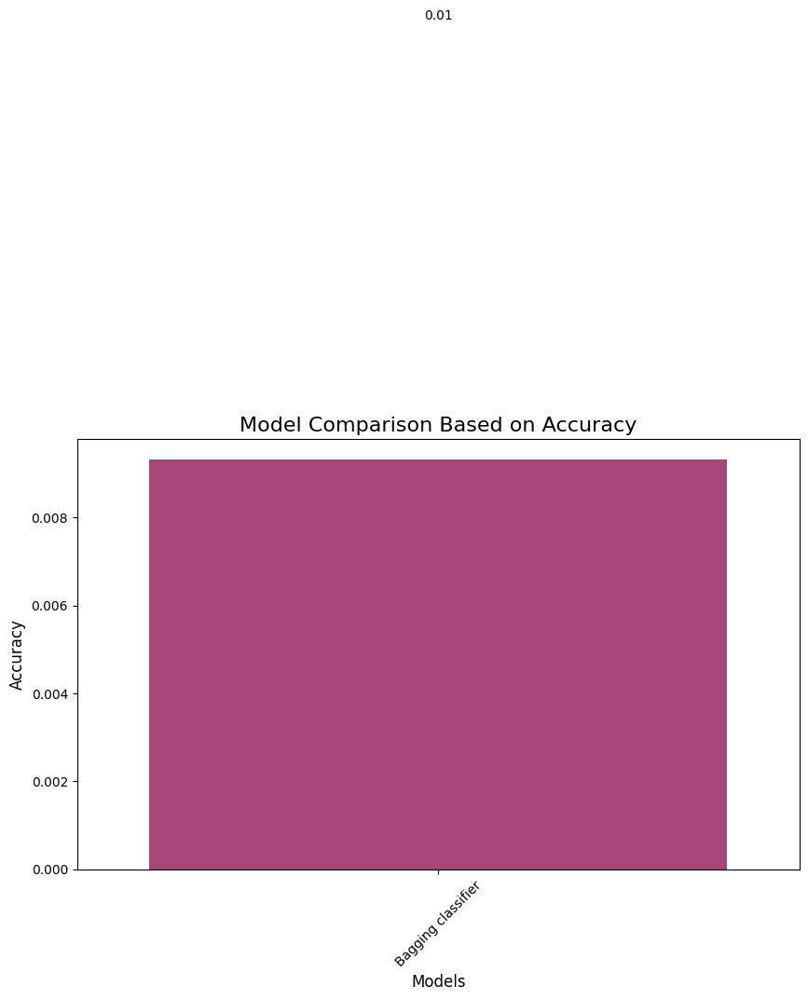

In [82]:
#Accuarcy Based Best Visualization

# Sort results based on accuracy
results_df_sorted = results_df.sort_values(by="Accuracy", ascending=False).reset_index()

# Create a barplot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=results_df_sorted, x='index', y='Accuracy', palette='magma')

# Add titles and labels
plt.title('Model Comparison Based on Accuracy', fontsize=16)
plt.xlabel('Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.xticks(rotation=45)  # Rotate model names for better visibility

# Annotate the bar chart with accuracy values
for index, value in enumerate(results_df_sorted['Accuracy']):
    plt.text(index, value + 0.01, f'{value:.2f}', ha='center', fontsize=10, color='black')

# Show the plot
plt.tight_layout()
plt.show()

In [83]:
# Train a GradientBoosting Model

In [84]:
# Import SimpleImputer
from sklearn.impute import SimpleImputer

# Create an imputer to replace NaN with the mean of the column
imputer = SimpleImputer(strategy='mean')  # You can change the strategy if needed

# Fit the imputer on your training data and transform both train and test data
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Now you can train your GradientBoostingClassifier
best_model = GradientBoostingClassifier(random_state=42)
best_model.fit(X_train, y_train)



GradientBoostingClassifier(random_state=42)

In [85]:
# Import necessary libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # Import OneHotEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer  # Import ColumnTransformer
from sklearn.pipeline import Pipeline  # Import Pipeline


# Assuming 'path_df1' is your DataFrame and 'Country' is your target column
X = path_df1.drop('Country', axis=1)
y = path_df1['Country']

# Encode the target variable (Country)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Changes start here ---

# 1. Identify numerical and categorical features
numerical_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

# 2. Create preprocessing pipelines for numerical and categorical features
numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Use most_frequent for categorical
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)), # One-hot encode categorical features
])

# 3. Combine pipelines using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
        ('cat', categorical_pipeline, categorical_features),
    ])

# 4. Apply preprocessing to train and test data
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)



# Continue with Feature Selection and Model Training
# ... (rest of your code, using X_train_processed and X_test_processed)


# Now train your GradientBoostingClassifier
best_model = GradientBoostingClassifier(random_state=42)
best_model.fit(X_train_processed, y_train)  # Use processed data

# Make predictions and evaluate
y_pred = best_model.predict(X_test_processed)  # Use processed data
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Test Accuracy: {test_accuracy}")

Test Accuracy: 1.0


HYPERPARAMETER TUNING

In [86]:
rf_model = RandomForestClassifier(random_state=42)

In [87]:
# Define the parameter grid
param_grid = {
    'n_estimators': [10, 200],
    'max_depth': [None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1]
}

In [88]:
# Import necessary libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # Import OneHotEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV # Import GridSearchCV here
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer  # Import ColumnTransformer
from sklearn.pipeline import Pipeline  # Import Pipeline

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=3,  # Number of cross-validation folds
    verbose=2,  # Print progress
    n_jobs=-1   # Use all processors
)


In [89]:
grid_search.fit(X_train_scaled, y_train)
best_param=grid_search.best_params_
# Best parameters
print("Best Parameters:", grid_search.best_params_)
print("Best Score (Accuracy):", grid_search.best_score_)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10}
Best Score (Accuracy): 0.08051245310439707


In [90]:
#evaluate the best model
#train the best model from grid search on the entire training data
best_model=GradientBoostingClassifier(**best_param,random_state=42)
best_model.fit(X_train_scaled,y_train)
#predict on the test data
y_test_pred=best_model.predict(X_test_scaled)
#Evaluate the model
# Changed 'average' to 'weighted' for multiclass classification
test_f1=f1_score(y_test,y_test_pred, average='weighted')

print(f"F1:{test_f1}")

F1:0.006993006993006993


In [91]:
test_accuracy = accuracy_score(y_test, y_test_pred)  # Use accuracy_score function
print(f"Test Accuracy: {test_accuracy:.4f}")

Test Accuracy: 0.0070


PIPELINE

In [92]:
# Import necessary libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # Import OneHotEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV  # Import GridSearchCV here
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer  # Import ColumnTransformer
from sklearn.pipeline import Pipeline  # Import Pipeline


# Assuming 'path_df1' is your DataFrame and 'ObjectId' is your target column
X = path_df1.drop('ISO2', axis=1)
y = path_df1['ISO2']

# Encode the target variable (ObjectId)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Changes start here ---

# 1. Identify numerical and categorical features
numerical_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

# 2. Create preprocessing pipelines for numerical and categorical features
numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Use most_frequent for categorical
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)), # One-hot encode categorical features
])

# 3. Combine pipelines using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
        ('cat', categorical_pipeline, categorical_features),
    ])

# 4. Apply preprocessing to train and test data
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)



# Continue with Feature Selection and Model Training
# ... (rest of your code, using X_train_processed and X_test_processed)


# Now train your GradientBoostingClassifier
best_model = GradientBoostingClassifier(random_state=42)
best_model.fit(X_train_processed, y_train)  # Use processed data

# Make predictions and evaluate
y_pred = best_model.predict(X_test_processed)  # Use processed data
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Test Accuracy: {test_accuracy}")






Test Accuracy: 1.0


UNSEEN DATA PREDICTION

In [93]:
unseen = pd.read_csv('/content/drive/MyDrive/Dataset DSML/Trade_in_Low_Carbon_Tech.csv', encoding='latin1')  # or 'ISO-8859-1' or 'cp1252'

In [ ]:
unseen.head()

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,F2023
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Comparative advantage in low carbon technology...,Index,Department of Economic and Social Affairs/Unit...,ECBTLA,Trade in Low Carbon Technology Products; Compa...,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,NaN,8.920000e-05,8.180000e-05,5.877250e-04,NaN,NaN,NaN,NaN
1,2,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,NaN,3.401980e+03,3.217850e+03,2.408955e+04,NaN,NaN,NaN,NaN
2,3,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as p...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,NaN,1.800000e-05,1.750000e-05,1.276220e-04,NaN,NaN,NaN,NaN
3,4,"Afghanistan, Islamic Rep. of",AF,AFG,Exports of low carbon technology products as s...,Percent,Department of Economic and Social Affairs/Unit...,ECBTLX,Trade in Low Carbon Technology Products; Exports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,NaN,NaN,4.077410e-04,3.676780e-04,2.788680e-03,NaN,NaN,NaN,NaN
4,5,"Afghanistan, Islamic Rep. of",AF,AFG,Imports of low carbon technology products,US Dollars,Department of Economic and Social Affairs/Unit...,ECBTLM,Trade in Low Carbon Technology Products; Imports,"Environment, Climate Change, Mitigation, Trade...",...,NaN,8503327.0,6561112.0,1.611734e+07,1.912370e+07,1.054682e+08,NaN,NaN,NaN,NaN


In [94]:
unseen.columns

Index(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
       'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor', 'Trade_Flow', 'Scale',
       'F1994', 'F1995', 'F1996', 'F1997', 'F1998', 'F1999', 'F2000', 'F2001',
       'F2002', 'F2003', 'F2004', 'F2005', 'F2006', 'F2007', 'F2008', 'F2009',
       'F2010', 'F2011', 'F2012', 'F2013', 'F2014', 'F2015', 'F2016', 'F2017',
       'F2018', 'F2019', 'F2020', 'F2021', 'F2022', 'F2023', 'unseen_pred'],
      dtype='object')

In [95]:
# Import necessary libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # Import OneHotEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV  # Import GridSearchCV here
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer  # Import ColumnTransformer
from sklearn.pipeline import Pipeline  # Import Pipeline


# Assuming 'path_df1' is your DataFrame and 'ISO2' is your target column
X = path_df1.drop('ISO2', axis=1)
y = path_df1['ISO2']

# Encode the target variable (ISO2)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Changes start here ---

# 1. Identify numerical and categorical features
numerical_features = X_train.select_dtypes(include=['number']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

# 2. Create preprocessing pipelines for numerical and categorical features
numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Use most_frequent for categorical
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)), # One-hot encode categorical features
])

# 3. Combine pipelines using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
        ('cat', categorical_pipeline, categorical_features),
    ])

# Create the pipeline with preprocessor and model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', GradientBoostingClassifier(random_state=42)),
])


# Fit the pipeline on training data
pipeline.fit(X_train, y_train)

# Now train your GradientBoostingClassifier


prediction=pipeline.predict(unseen)

In [96]:
unseen.columns

Index(['ObjectId', 'Country', 'ISO2', 'ISO3', 'Indicator', 'Unit', 'Source',
       'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor', 'Trade_Flow', 'Scale',
       'F1994', 'F1995', 'F1996', 'F1997', 'F1998', 'F1999', 'F2000', 'F2001',
       'F2002', 'F2003', 'F2004', 'F2005', 'F2006', 'F2007', 'F2008', 'F2009',
       'F2010', 'F2011', 'F2012', 'F2013', 'F2014', 'F2015', 'F2016', 'F2017',
       'F2018', 'F2019', 'F2020', 'F2021', 'F2022', 'F2023', 'unseen_pred'],
      dtype='object')

In [97]:
# Display the result
print(f"Predicted : {prediction[0]}")

Predicted : 2


In [98]:
test_accuracy = pipeline.score(X_test,y_test)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 1.00


In [99]:
unseen['unseen_pred']=prediction

In [100]:
unseen.to_csv('/content/drive/MyDrive/Dataset DSML/Trade_in_Low_Carbon_Tech.csv',index=False)


UNSEEN EVALUATION

In [103]:
# unseen metrices finding
# Assuming 'unseen' DataFrame has a column named 'ISO2' for true labels
y_actual = unseen['ISO2']  # Define y_actual

# Handle missing values in y_actual (e.g., fill with the most frequent value)
y_actual = y_actual.fillna(y_actual.mode()[0])  # Fill NaN with mode

# Now you can safely encode:
y_actual = label_encoder.transform(y_actual)  # Encode y_actual

# Assuming 'unseen' DataFrame has a column named 'unseen_pred' for predicted labels
y_prediction = unseen['unseen_pred']  # Define y_prediction

# Now you can calculate the metrics:
test_accuracy = accuracy_score(y_actual, y_prediction)
test_precision = precision_score(y_actual, y_prediction, average='macro')
test_recall = recall_score(y_actual, y_prediction, average='macro')
test_f1 = f1_score(y_actual, y_prediction, average='macro')

print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Test Precesion: {test_precision:.2f}")
print(f"Test Recall: {test_recall:.2f}")
print(f"Test F1: {test_f1:.2f}")

Test Accuracy: 0.98
Test Precesion: 0.99
Test Recall: 1.00
Test F1: 0.99


In [104]:
#  Print results
print("Predictions for Unseen Data:",y_prediction)
print("\nTrue Labels for Unseen Data:", y_actual)
print(f"Accuracy on Unseen Data: {test_accuracy:.2f}")

Predictions for Unseen Data: 0         2
1         2
2         2
3         2
4         2
       ... 
2138    203
2139    203
2140    203
2141    203
2142    203
Name: unseen_pred, Length: 2143, dtype: int64

True Labels for Unseen Data: [  2   2   2 ... 203 203 203]
Accuracy on Unseen Data: 0.98


Prediction vs actual Visualization

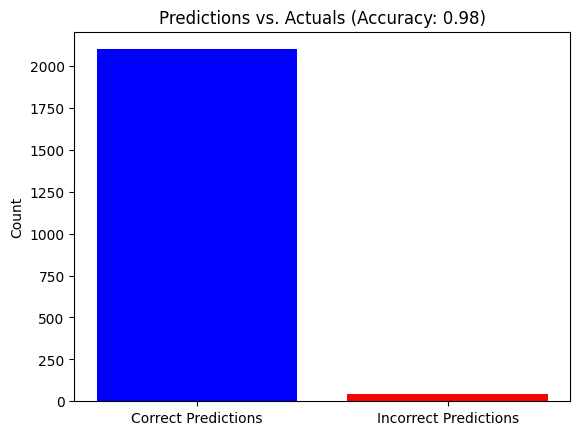

In [105]:
# Count correct predictions
correct = np.sum(np.array(y_prediction) == np.array(y_actual))
incorrect = len(y_actual) - correct

# Bar plot
labels = ['Correct Predictions', 'Incorrect Predictions']
values = [correct, incorrect]

plt.bar(labels, values, color=['blue', 'red'])
plt.title(f"Predictions vs. Actuals (Accuracy: {test_accuracy:.2f})")
plt.ylabel("Count")
plt.show()